In [108]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from statsmodels.stats.diagnostic import het_breuschpagan, het_goldfeldquandt
from statsmodels.stats.stattools import durbin_watson
import statsmodels.tsa.api as smt
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.diagnostic import acorr_breusch_godfrey
from statsmodels.sandbox.regression.predstd import wls_prediction_std
from statsmodels.stats.outliers_influence import summary_table
import warnings

warnings.filterwarnings("ignore")

# Датасет

In [54]:
data = pd.read_excel('Доля МСП в ВРП1.xlsx', header = 0)

In [55]:
data = data.drop(columns = ['Доля МСП в ВРП', 'Доля МСП в ВРП.1']).rename(columns =
            {'Unnamed: 0': 'region', 'Доля МСП в ВРП.2': 'Доля МСП в ВРП',
             'Объем поддержки, оказанной Сбером': 'Объем поддержки, оказанной Сбером - кол-во ИП/ООО',
             'Unnamed: 7': 'Объем поддержки, оказанной Сбером - млн',
             'Госзакупки за 2021 год': 'Госзакупки за 2021 год - кол-во',
             'Unnamed: 24': 'Госзакупки за 2021 год - объем',
             'Отраслевая структура валовой добавленной стоимости субъектов Российской Федерации в 2021 г.* ': 'Отраслевая структура: Добыча полезных ископаемых',
             'Unnamed: 15': 'Отраслевая структура: Сельское хозяйство',
             'Unnamed: 16': 'Отраслевая структура: Обрабатывающие производства'}).iloc[1:]

In [56]:
data = data.drop(columns = ['Доля отрасли с наибольшей  с наибольшей долей валовой добавленной стоимости в субъекте'])

In [57]:
data_rf = data.iloc[0]
data_all = data.iloc[1:]
data_all = data_all.replace('-', np.nan)
data_all.drop(columns = ['region', 'Доля МСП в ВРП (несырьерой сектор)'], inplace = True)

In [58]:
Y = data_all['Доля МСП в ВРП']
cat_cols = ['наличие ОЭЗ',
            'Отрасль с наибольшей долей валовой добавленной стоимости в субъекте']
num_cols = list(set(data_all.columns).difference(set(cat_cols + ['Доля МСП в ВРП'])))

In [59]:
data_all[num_cols] = data_all[num_cols].fillna(data_all[num_cols].mean())
data_all['наличие ОЭЗ'] = data_all['наличие ОЭЗ'].fillna(0)

# Статистические характеристики

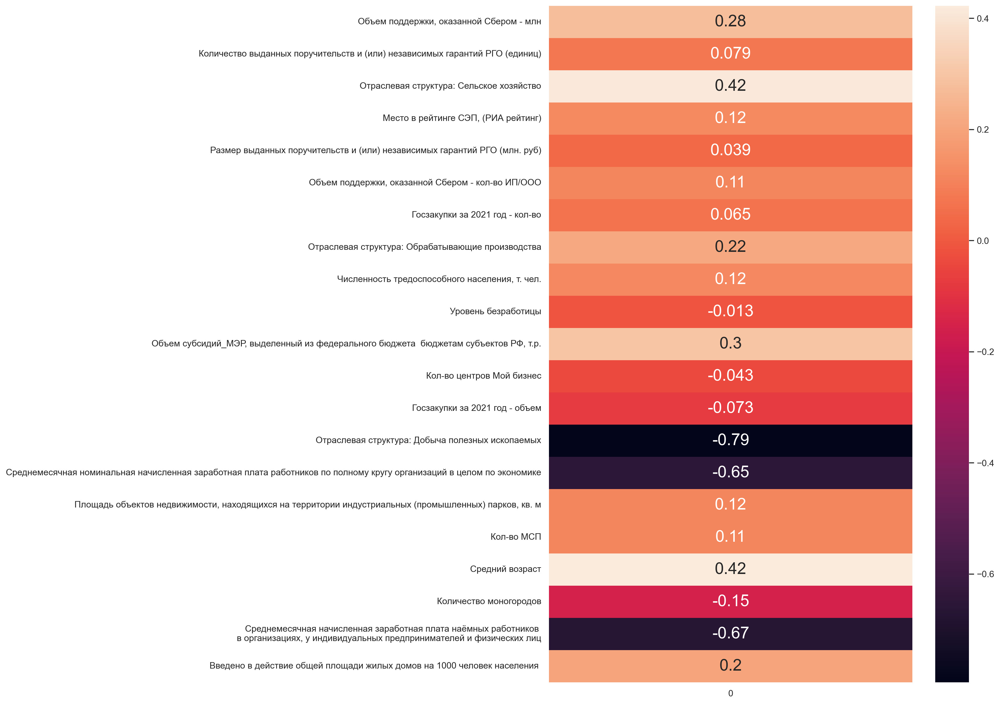

In [60]:
data_all_corr = data_all[num_cols]
data_all_corr['Доля МСП в ВРП'] = data_all['Доля МСП в ВРП']
data_all_corr = data_all_corr.apply(pd.to_numeric)

plt.figure(figsize=(10, 15))

corr_with_target = data_all_corr.drop(columns='Доля МСП в ВРП').corrwith(data_all_corr['Доля МСП в ВРП'])
sns.heatmap(pd.DataFrame(corr_with_target), annot = True, annot_kws = {'size':20})
# ax.tick_params(rotation=0)
# ax.set_xticks([])
# ax.set_title('Корреляция с долей МСП в ВРП')
plt.show()

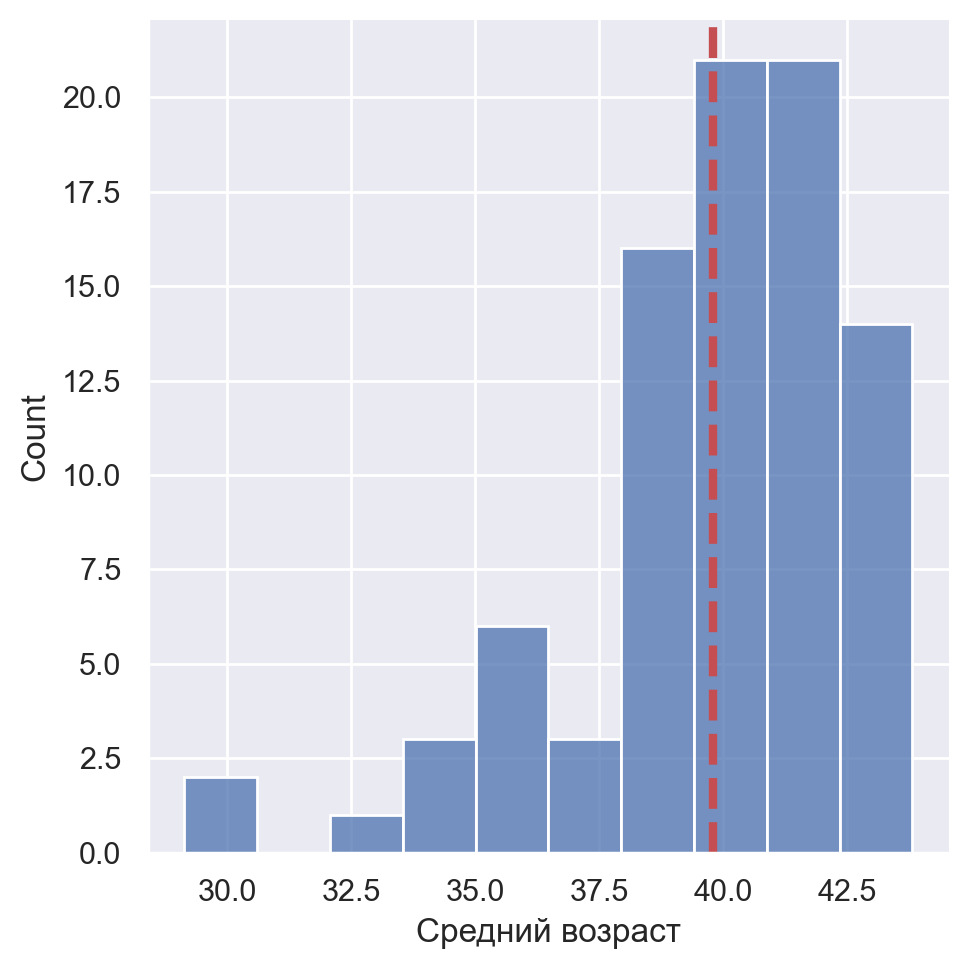

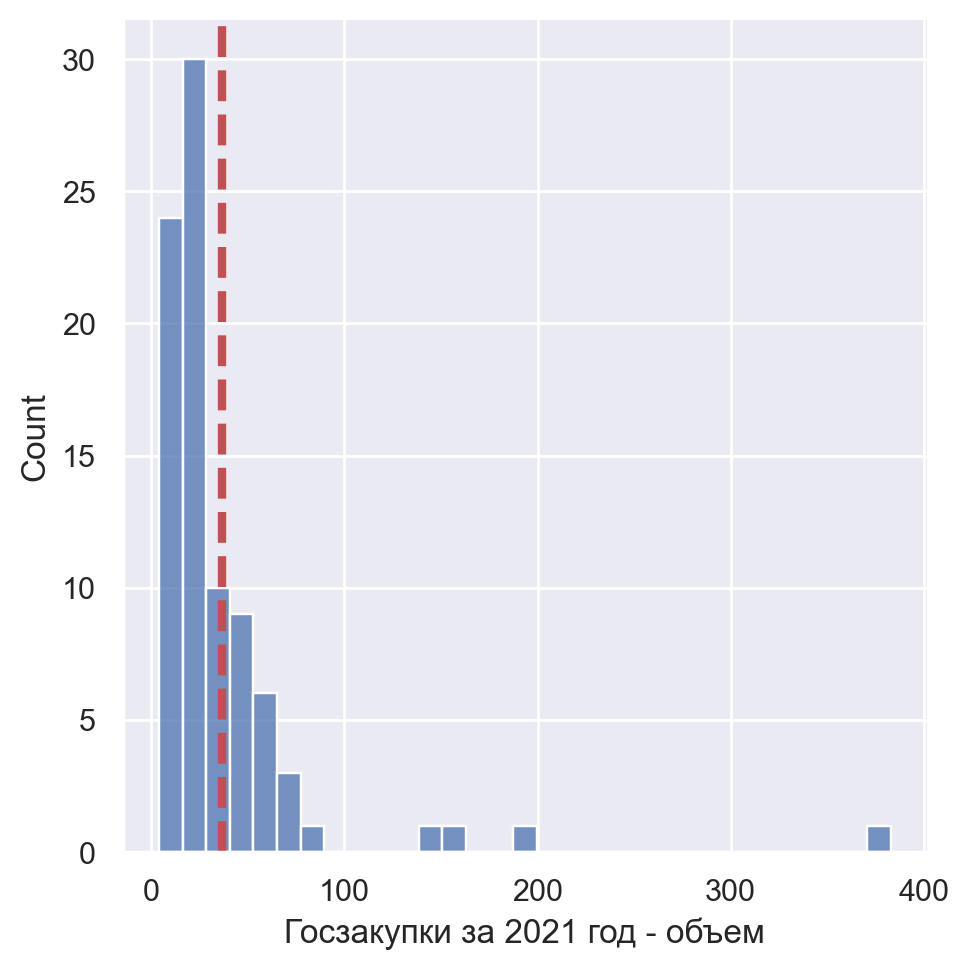

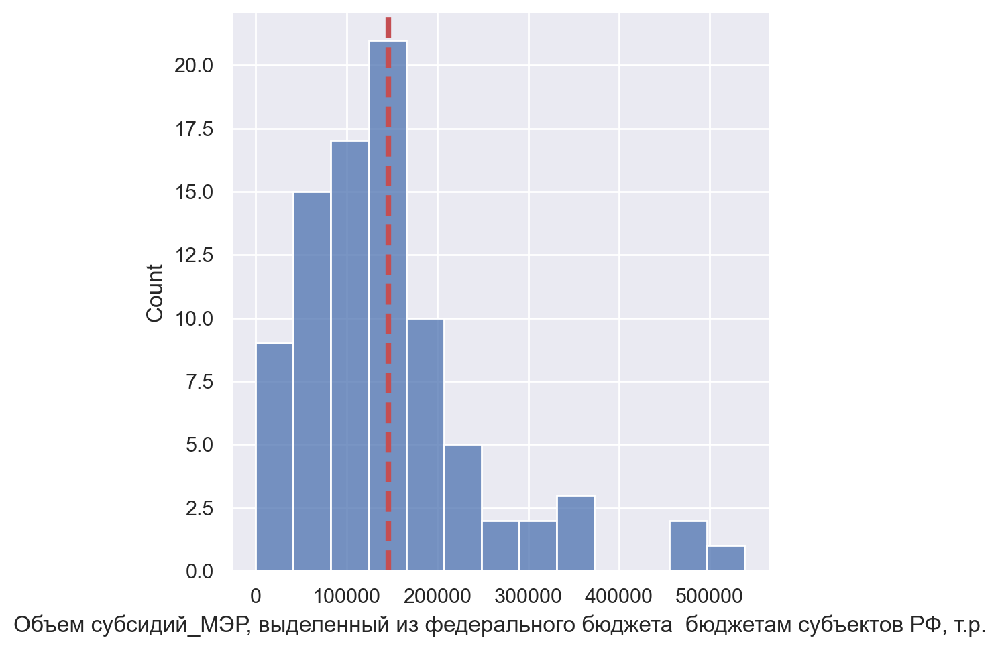

In [61]:
columns = ['Средний возраст', 'Госзакупки за 2021 год - объем', 'Объем субсидий_МЭР, выделенный из федерального бюджета  бюджетам субъектов РФ, т.р.']
for i in columns:
    sns.displot(data_all[i])
    plt.axvline(np.mean(data_all[i]), color='r', linestyle='dashed', linewidth=3)

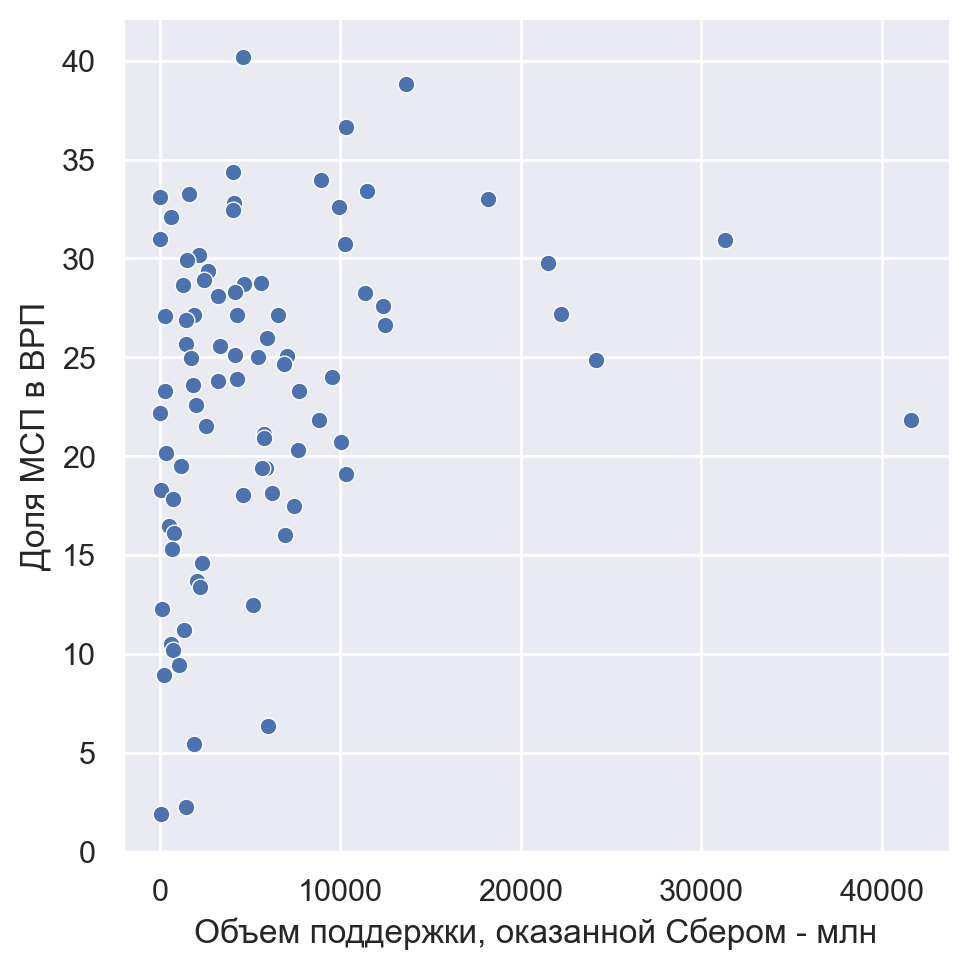

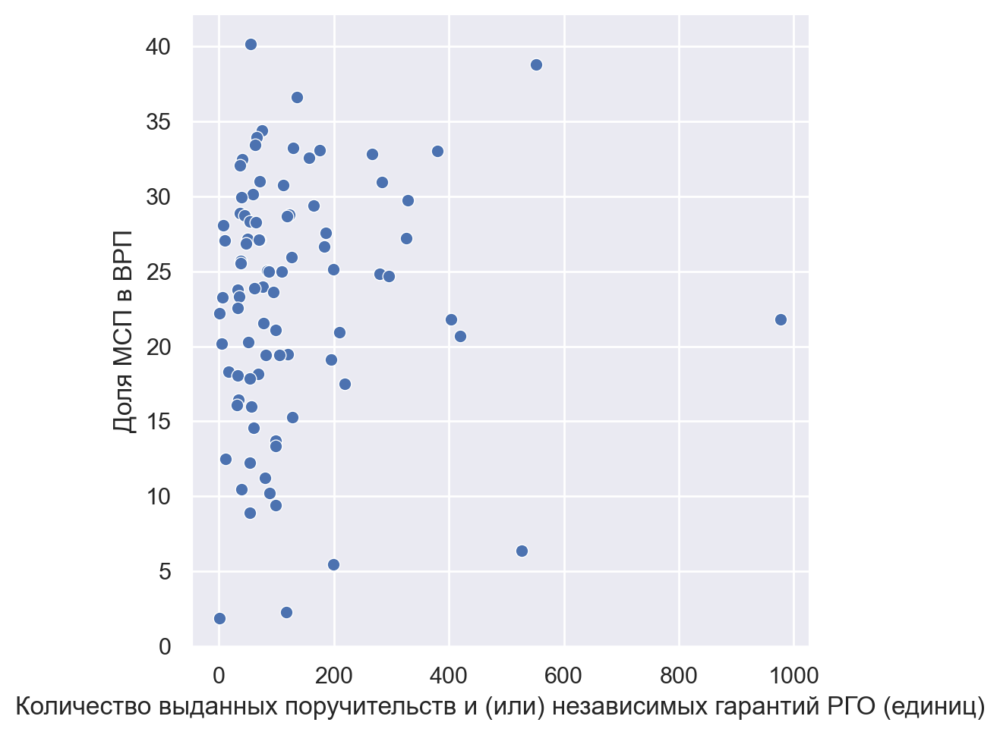

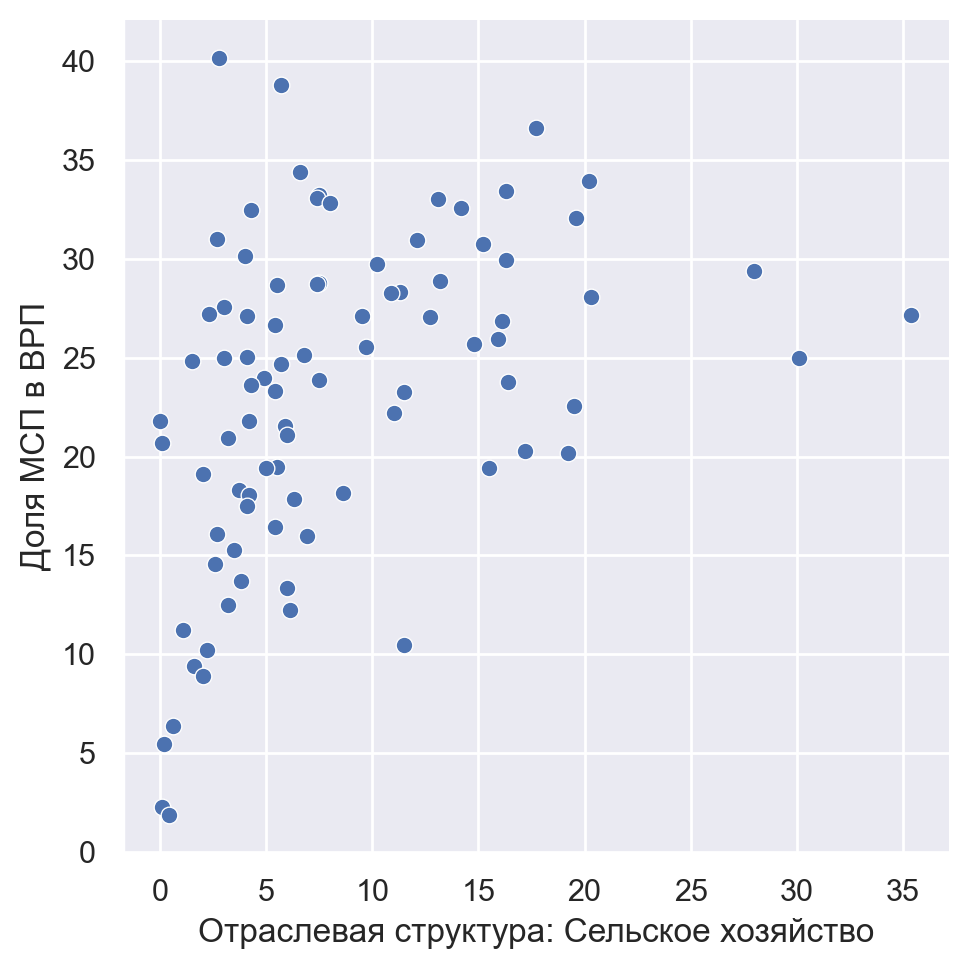

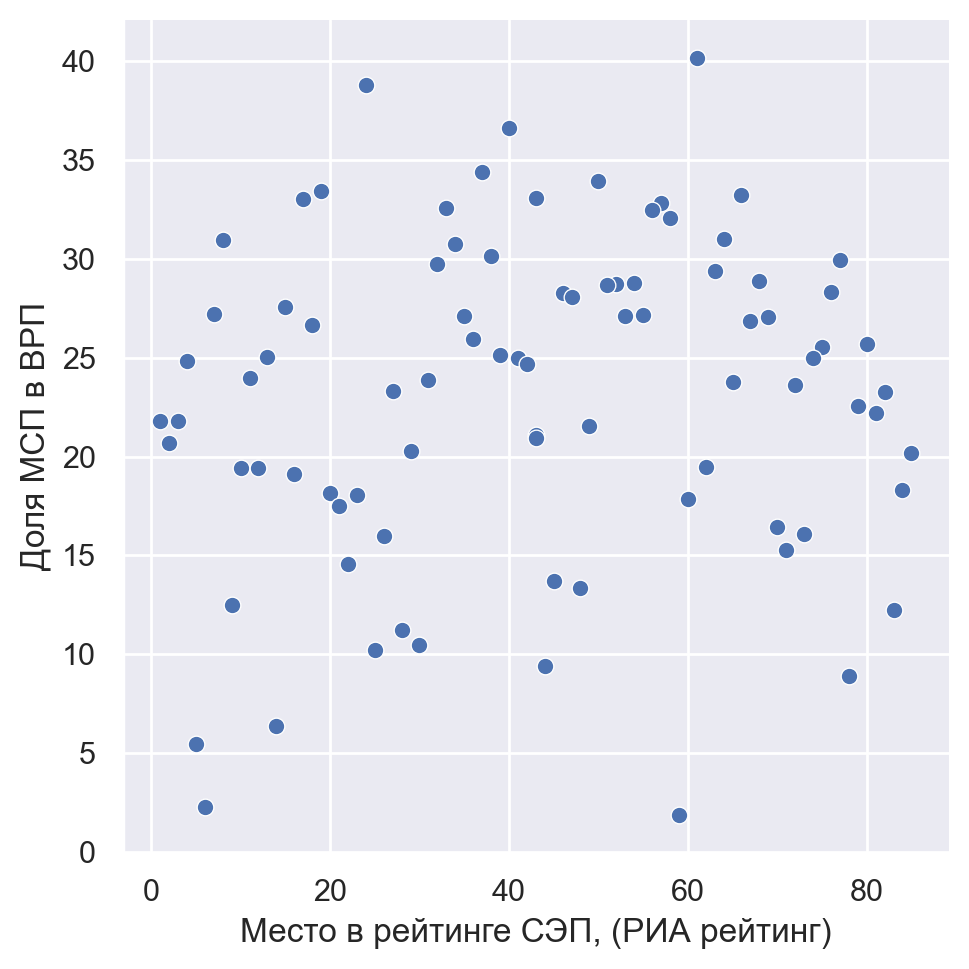

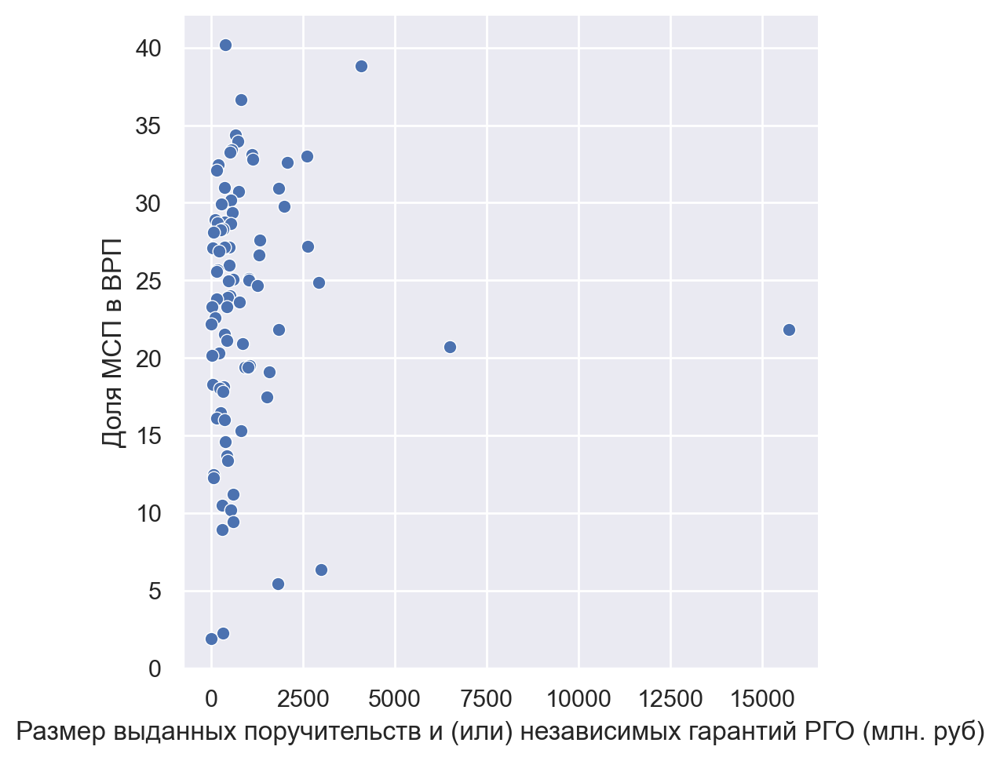

...

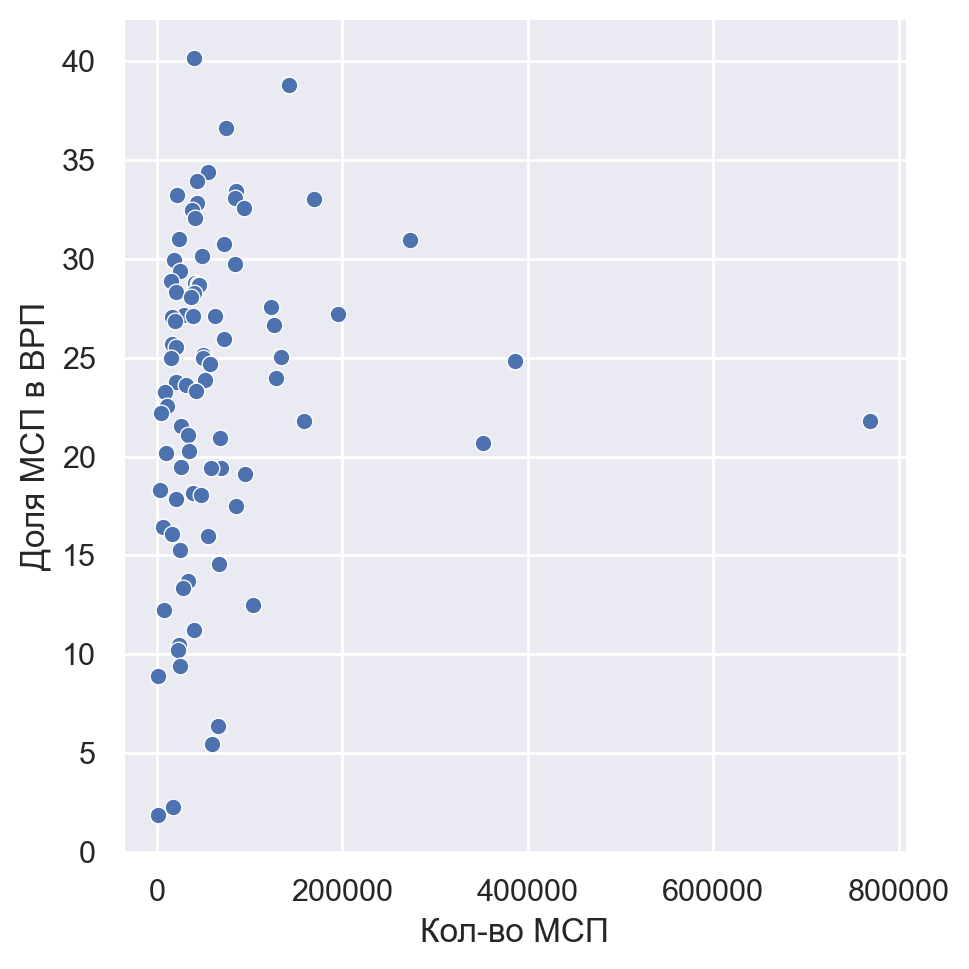

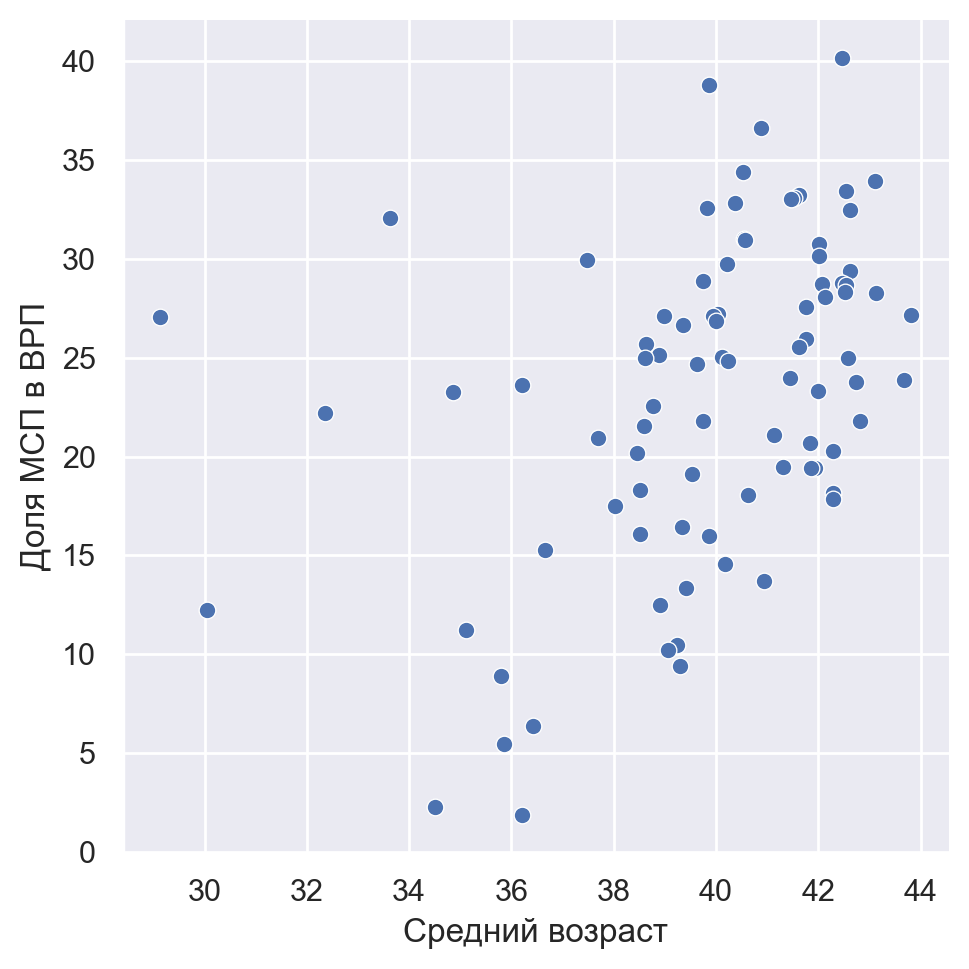

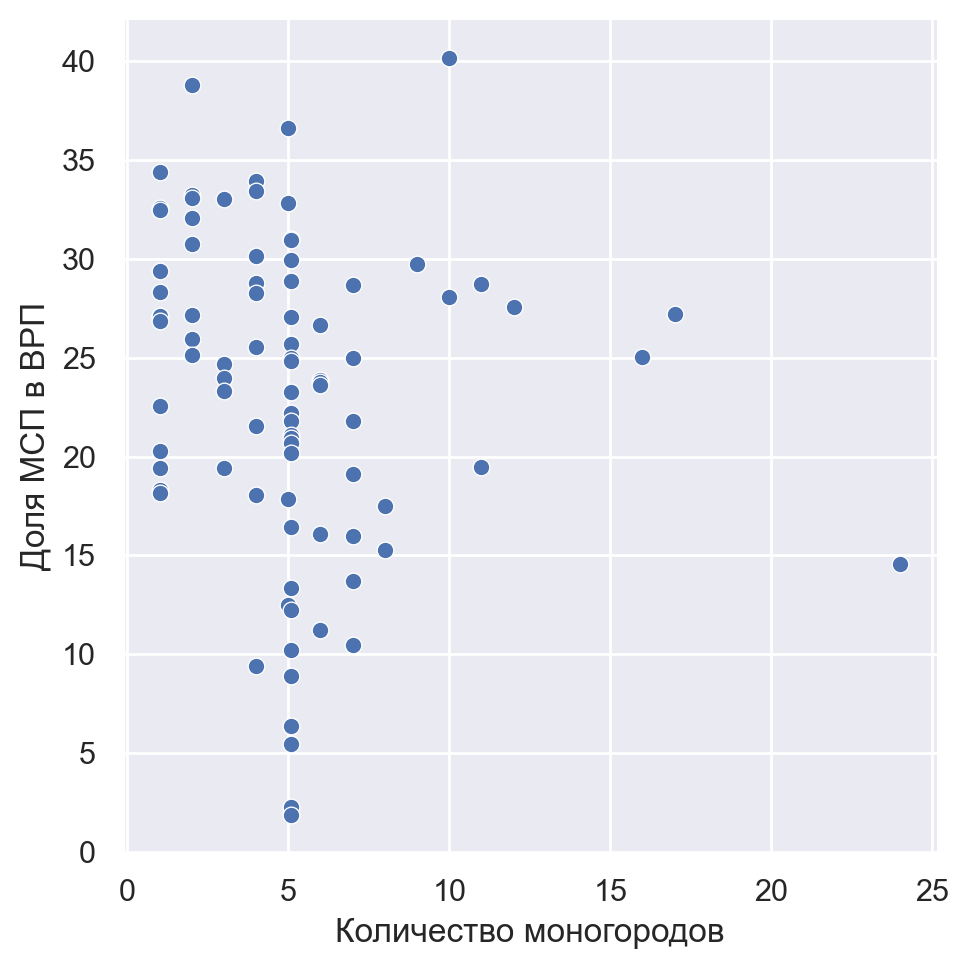

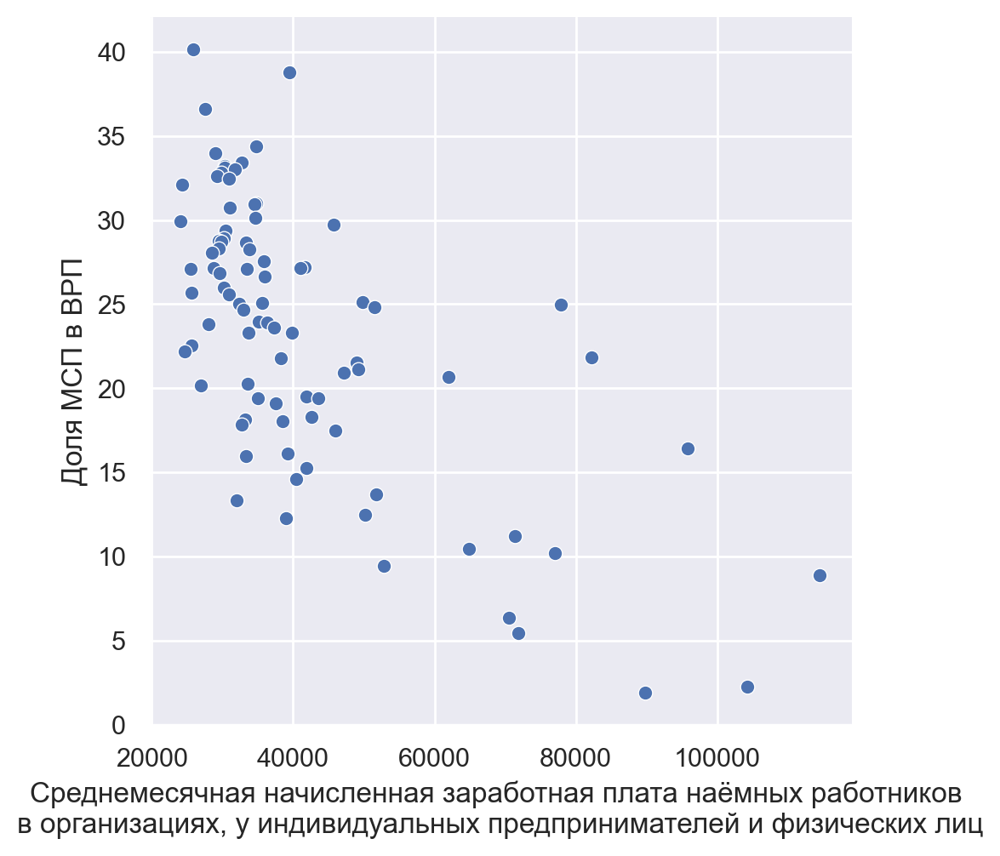

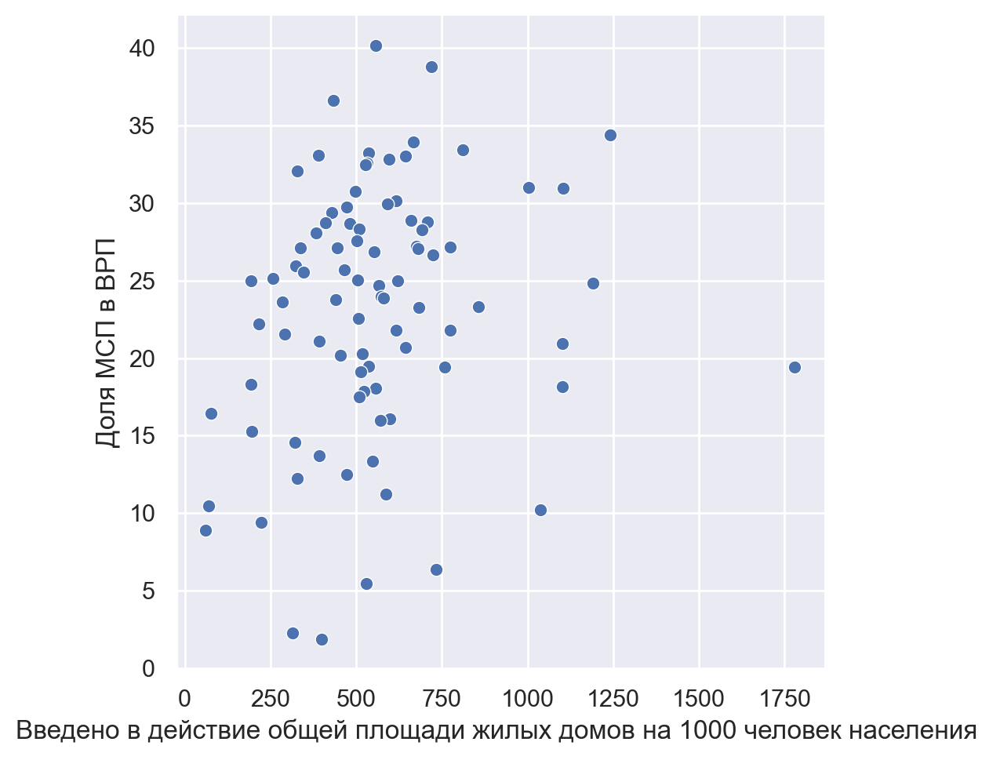

In [62]:
for col in num_cols:
    sns.relplot(x=data_all[col], y=Y)
    plt.show()

# Оценка регрессии методом МНК

In [63]:
rep = {'Государственное управление и обеспечение военной безопасности; социальное обеспечение': 'Другое',
      'Транспортировка и хранение': 'Другое', 'Строительство': 'Другое'}
tmp_df = data_all['Отрасль с наибольшей долей валовой добавленной стоимости в субъекте'].replace(rep).to_frame()
cols2 = pd.get_dummies(tmp_df['Отрасль с наибольшей долей валовой добавленной стоимости в субъекте'], prefix = 'Главная отрасль: ')
cols2 = cols2.drop(columns = ['Главная отрасль: _Другое'])

In [64]:
X = pd.concat([data_all[num_cols], data_all['наличие ОЭЗ'], cols2], axis = 1)
X = sm.add_constant(X)

In [65]:
ks = sm.OLS(Y, X)
ks_res = ks.fit()
ks_res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         Доля МСП в ВРП   R-squared:                       0.835
Model:                            OLS   Adj. R-squared:                  0.759
Method:                 Least Squares   F-statistic:                     11.04
Date:                Mon, 04 Dec 2023   Prob (F-statistic):           1.68e-14
Time:                        13:58:41   Log-Likelihood:                -227.17
No. Observations:                  87   AIC:                             510.3
Df Residuals:                      59   BIC:                             579.4
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
======================================================================================================================================================================================================
                                                                                                                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                                                 21.2438     17.337      1.225      0.225     -13.448      55.936
Объем поддержки, оказанной Сбером - млн                                                                                                0.0002      0.000      1.181      0.242      -0.000       0.001
Количество выданных поручительств и (или) независимых гарантий РГО (единиц)                                                            0.0126      0.010      1.202      0.234      -0.008       0.034
Отраслевая структура: Сельское хозяйство                                                                                              -0.1769      0.127     -1.394      0.169      -0.431       0.077
Место в рейтинге СЭП, (РИА рейтинг)                                                                                                   -0.0170      0.047     -0.363      0.718      -0.111       0.077
Размер выданных поручительств и (или) независимых гарантий РГО (млн. руб)                                                             -0.0004      0.002     -0.236      0.814      -0.004       0.003
Объем поддержки, оказанной Сбером - кол-во ИП/ООО                                                                                      0.0029      0.005      0.629      0.532      -0.006       0.012
Госзакупки за 2021 год - кол-во                                                                                                     1.264e-05   7.57e-05      0.167      0.868      -0.000       0.000
Отраслевая структура: Обрабатывающие производства                                                                                     -0.3274      0.092     -3.548      0.001      -0.512      -0.143
Численность тредоспособного населения, т. чел.                                                                                         0.0013      0.003      0.391      0.697      -0.005       0.008
Уровень безработицы                                                                                                                   -0.1655      0.220     -0.753      0.454      -0.605       0.274
Объем субсидий_МЭР, выделенный из федерального бюджета  бюджетам субъектов РФ, т.р.                                                 5.009e-06   5.95e-06      0.842      0.403   -6.89e-06    1.69e-05
Кол-во центров Мой бизнес                                                                         

# Мультиколлинеарность

In [66]:
corr_matrix = X.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
to_drop = [column for column in upper.columns if any(upper[column] > 0.8)]
to_drop

['Размер выданных поручительств и (или) независимых гарантий РГО (млн. руб)',
 'Объем поддержки, оказанной Сбером - кол-во ИП/ООО',
 'Госзакупки за 2021 год - кол-во',
 'Численность тредоспособного населения, т. чел.',
 'Госзакупки за 2021 год - объем',
 'Кол-во МСП',
 'Среднемесячная начисленная заработная плата наёмных работников \nв организациях, у индивидуальных предпринимателей и физических лиц',
 'Главная отрасль: _Добыча полезных ископаемых']

In [67]:
len(to_drop)

8

In [68]:
corr_mat_2 = pd.DataFrame(np.array([variance_inflation_factor(X.values, i) for i in range(1, X.shape[1])]).reshape(1, -1), columns=list(X.columns[1:]))
corr_mat_2

,"Объем поддержки, оказанной Сбером - млн",Количество выданных поручительств и (или) независимых гарантий РГО (единиц),Отраслевая структура: Сельское хозяйство,"Место в рейтинге СЭП, (РИА рейтинг)",Размер выданных поручительств и (или) независимых гарантий РГО (млн. руб),"Объем поддержки, оказанной Сбером - кол-во ИП/ООО",Госзакупки за 2021 год - кол-во,Отраслевая структура: Обрабатывающие производства,"Численность тредоспособного населения, т. чел.",Уровень безработицы,...,Средний возраст,Количество моногородов,"Среднемесячная начисленная заработная плата наёмных работников \nв организациях, у индивидуальных предпринимателей и физических лиц",Введено в действие общей площади жилых домов на 1000 человек населения,наличие ОЭЗ,Главная отрасль: _Деятельность по операциям с недвижимым имуществом,Главная отрасль: _Добыча полезных ископаемых,Главная отрасль: _Обрабатывающие производства,"Главная отрасль: _Сельское, лесное хозяйство, охота, рыболовство и рыбоводство",Главная отрасль: _Торговля оптовая и розничная; ремонт автотранспортных средств и мотоциклов
0,10.447829,12.660222,4.305352,7.032993,54.432764,24.647284,11.015847,6.972204,61.550028,4.839955,...,6.42856,1.481053,238.331994,1.899684,1.485945,2.412722,11.541751,10.411019,4.202477,4.299962


In [69]:
corr_mat_2[to_drop]

,Размер выданных поручительств и (или) независимых гарантий РГО (млн. руб),"Объем поддержки, оказанной Сбером - кол-во ИП/ООО",Госзакупки за 2021 год - кол-во,"Численность тредоспособного населения, т. чел.",Госзакупки за 2021 год - объем,Кол-во МСП,"Среднемесячная начисленная заработная плата наёмных работников \nв организациях, у индивидуальных предпринимателей и физических лиц",Главная отрасль: _Добыча полезных ископаемых
0,54.432764,24.647284,11.015847,61.550028,25.458881,77.230505,238.331994,11.541751


In [104]:
corr_mat_2[corr_mat_2>10]

,"Объем поддержки, оказанной Сбером - млн",Количество выданных поручительств и (или) независимых гарантий РГО (единиц),Отраслевая структура: Сельское хозяйство,"Место в рейтинге СЭП, (РИА рейтинг)",Размер выданных поручительств и (или) независимых гарантий РГО (млн. руб),"Объем поддержки, оказанной Сбером - кол-во ИП/ООО",Госзакупки за 2021 год - кол-во,Отраслевая структура: Обрабатывающие производства,"Численность тредоспособного населения, т. чел.",Уровень безработицы,...,Средний возраст,Количество моногородов,"Среднемесячная начисленная заработная плата наёмных работников \nв организациях, у индивидуальных предпринимателей и физических лиц",Введено в действие общей площади жилых домов на 1000 человек населения,наличие ОЭЗ,Главная отрасль: _Деятельность по операциям с недвижимым имуществом,Главная отрасль: _Добыча полезных ископаемых,Главная отрасль: _Обрабатывающие производства,"Главная отрасль: _Сельское, лесное хозяйство, охота, рыболовство и рыбоводство",Главная отрасль: _Торговля оптовая и розничная; ремонт автотранспортных средств и мотоциклов
0,10.447829,12.660222,NaN,NaN,54.432764,24.647284,11.015847,NaN,61.550028,NaN,...,NaN,NaN,238.331994,NaN,NaN,NaN,11.541751,10.411019,NaN,NaN


In [70]:
print(f'{corr_mat_2[corr_mat_2>10].notna().iloc[0].sum()} признаков с VIF>10')

13 признаков с VIF>10


In [71]:
plt.figure(figsize=(50, 50))
with plt.style.context({'xtick.labelsize':35,
                        'ytick.labelsize':35}):
     dataplot = sns.heatmap(X.corr().abs(), cmap="YlGnBu", annot=True, annot_kws = {'size':27})
plt.show()

In [72]:
X_without_corr = X.drop(columns=to_drop)

In [73]:
ks_not_cor = sm.OLS(Y, X_without_corr)
ks_not_cor_res = ks_not_cor.fit()
ks_not_cor_res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         Доля МСП в ВРП   R-squared:                       0.800
Model:                            OLS   Adj. R-squared:                  0.743
Method:                 Least Squares   F-statistic:                     14.10
Date:                Mon, 04 Dec 2023   Prob (F-statistic):           1.44e-16
Time:                        13:59:02   Log-Likelihood:                -235.47
No. Observations:                  87   AIC:                             510.9
Df Residuals:                      67   BIC:                             560.3
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
========================================================================================================================================================================================
                                                                                                                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                                   26.7711     14.354      1.865      0.067      -1.879      55.421
Объем поддержки, оказанной Сбером - млн                                                                               4.967e-05      0.000      0.364      0.717      -0.000       0.000
Количество выданных поручительств и (или) независимых гарантий РГО (единиц)                                              0.0044      0.006      0.773      0.442      -0.007       0.016
Отраслевая структура: Сельское хозяйство                                                                                -0.0425      0.118     -0.360      0.720      -0.278       0.193
Место в рейтинге СЭП, (РИА рейтинг)                                                                                      0.0103      0.036      0.284      0.778      -0.062       0.083
Отраслевая структура: Обрабатывающие производства                                                                       -0.2711      0.084     -3.229      0.002      -0.439      -0.104
Уровень безработицы                                                                                                     -0.3268      0.216     -1.515      0.134      -0.757       0.104
Объем субсидий_МЭР, выделенный из федерального бюджета  бюджетам субъектов РФ, т.р.                                   1.128e-05   5.39e-06      2.092      0.040    5.15e-07     2.2e-05
Кол-во центров Мой бизнес                                                                                               -0.0089      0.075     -0.118      0.906      -0.159       0.142
Отраслевая структура: Добыча полезных ископаемых                                                                        -0.2139      0.048     -4.454      0.000      -0.310      -0.118
Среднемесячная номинальная начисленная заработная плата работников по полному кругу организаций в целом по экономике    -0.0001   3.49e-05     -4.123      0.000      -0.000   -7.42e-05
Площадь объектов недвижимости, находящихся на территории индустриальных (промышленных) парков, кв. м                 -1.955e-07   1.17e-06     -0.166      0.868   -2.54e-06    2.15e-06
Средний возраст                                                                                                          0.2322      0.325      0.714      0.478      -0.417       0.882
Количество моногородов                                                                                                  -0.

# Гетероскедастичность

In [74]:
ks_res.get_robustcov_results().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         Доля МСП в ВРП   R-squared:                       0.835
Model:                            OLS   Adj. R-squared:                  0.759
Method:                 Least Squares   F-statistic:                     21.11
Date:                Mon, 04 Dec 2023   Prob (F-statistic):           3.75e-21
Time:                        13:59:02   Log-Likelihood:                -227.17
No. Observations:                  87   AIC:                             510.3
Df Residuals:                      59   BIC:                             579.4
Df Model:                          27                                         
Covariance Type:                  HC1                                         
======================================================================================================================================================================================================
                                                                                                                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                                                 21.2438     18.183      1.168      0.247     -15.140      57.627
Объем поддержки, оказанной Сбером - млн                                                                                                0.0002      0.000      1.553      0.126   -6.81e-05       0.001
Количество выданных поручительств и (или) независимых гарантий РГО (единиц)                                                            0.0126      0.008      1.520      0.134      -0.004       0.029
Отраслевая структура: Сельское хозяйство                                                                                              -0.1769      0.131     -1.354      0.181      -0.438       0.084
Место в рейтинге СЭП, (РИА рейтинг)                                                                                                   -0.0170      0.042     -0.401      0.690      -0.102       0.068
Размер выданных поручительств и (или) независимых гарантий РГО (млн. руб)                                                             -0.0004      0.001     -0.330      0.742      -0.003       0.002
Объем поддержки, оказанной Сбером - кол-во ИП/ООО                                                                                      0.0029      0.004      0.669      0.506      -0.006       0.012
Госзакупки за 2021 год - кол-во                                                                                                     1.264e-05   7.39e-05      0.171      0.865      -0.000       0.000
Отраслевая структура: Обрабатывающие производства                                                                                     -0.3274      0.091     -3.604      0.001      -0.509      -0.146
Численность тредоспособного населения, т. чел.                                                                                         0.0013      0.003      0.401      0.690      -0.005       0.008
Уровень безработицы                                                                                                                   -0.1655      0.201     -0.823      0.414      -0.568       0.237
Объем субсидий_МЭР, выделенный из федерального бюджета  бюджетам субъектов РФ, т.р.                                                 5.009e-06   4.18e-06      1.197      0.236   -3.36e-06    1.34e-05
Кол-во центров Мой бизнес                                                                         

In [75]:
pd.DataFrame(np.array(het_goldfeldquandt(Y, X, idx=1, split=0.4, drop=0.2, alternative='increasing')).reshape(1, -1), columns=['fvalfloat', 'pvalfloat', 'orderingstr'])

,fvalfloat,pvalfloat,orderingstr
0,0.47015033776926146,0.8339378134888127,increasing


In [76]:
#hetero = pd.DataFrame()
#for feature in num_cols:
#    x = X[feature]
#    x = sm.add_constant(x)
#    add = pd.DataFrame(np.array(het_breuschpagan(ks_res.resid, x)).reshape(1, -1),columns=['lm', 'lm_pvalue', 'fvalue', 'f_pvalue'])
#    add['feature'] = feature
#    hetero = pd.concat([hetero, add])

In [77]:
#hetero[hetero['f_pvalue'] < 0.05]

In [78]:
#x = X.copy()

In [79]:
#x['Место в рейтинге СЭП, (РИА рейтинг)^2'] = x['Место в рейтинге СЭП, (РИА рейтинг)']**2

In [80]:
# Добавим квадраты переменных и их перемножения
#pd.DataFrame(np.array(het_breuschpagan(ks_res.resid, x[['Место в рейтинге СЭП, (РИА рейтинг)^2', 'Место в рейтинге СЭП, (РИА рейтинг)']])).reshape(1, -1), columns=['lm', 'lm_pvalue', 'fvalue', 'f_pvalue'])
# H0 отвергается на 5% (2.389206e-09 < 0.05)
# Гетероскедастичность есть!

In [81]:
#ks_res.get_robustcov_results(cov_type='HC3').summary()

# Автокорреляция ошибок

In [82]:
fig = px.scatter(y=ks_res.resid, x=ks_res.resid.shift(1))
fig.show()

In [83]:
durbin_watson(ks_res.resid)

1.6207940198178221

Автокорреляции нет

# Другие наборы переменных

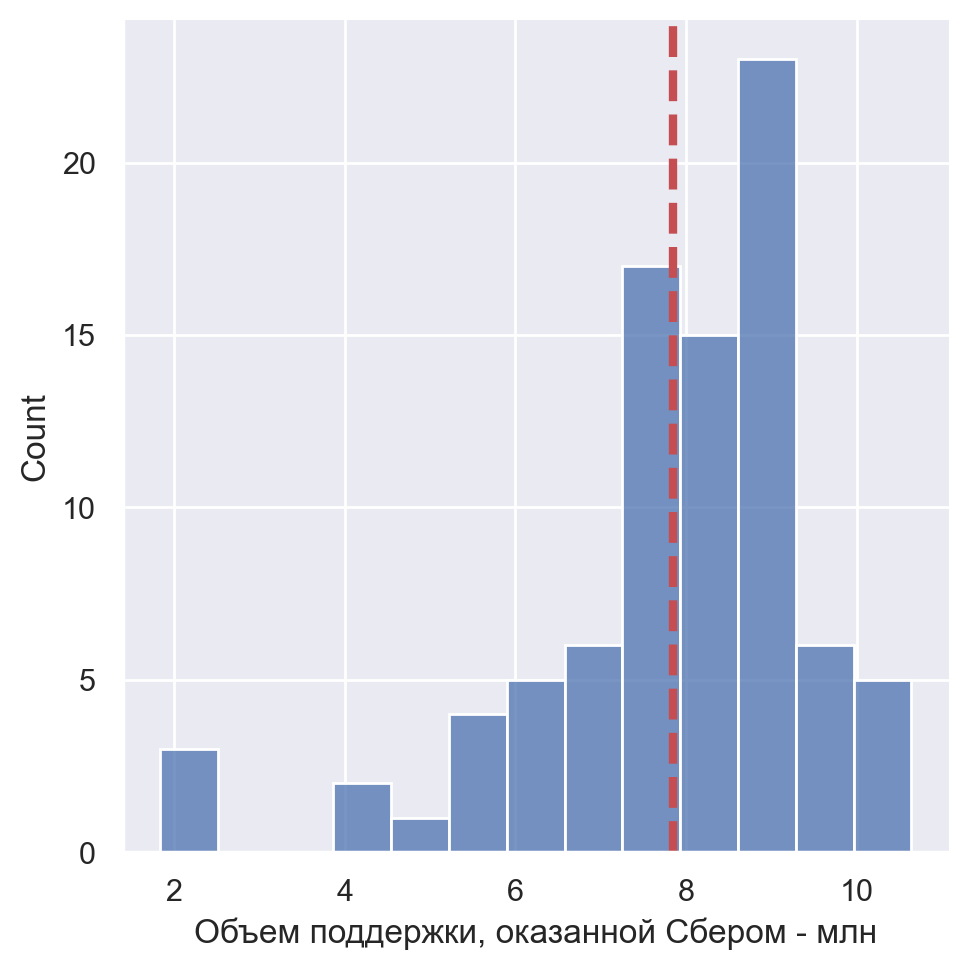

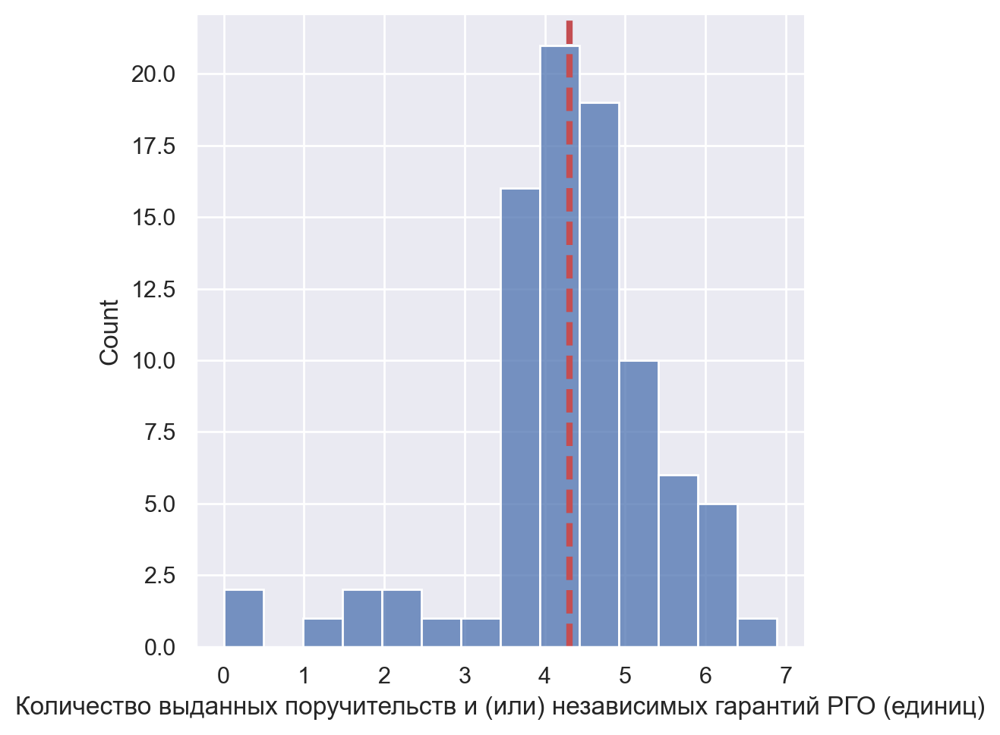

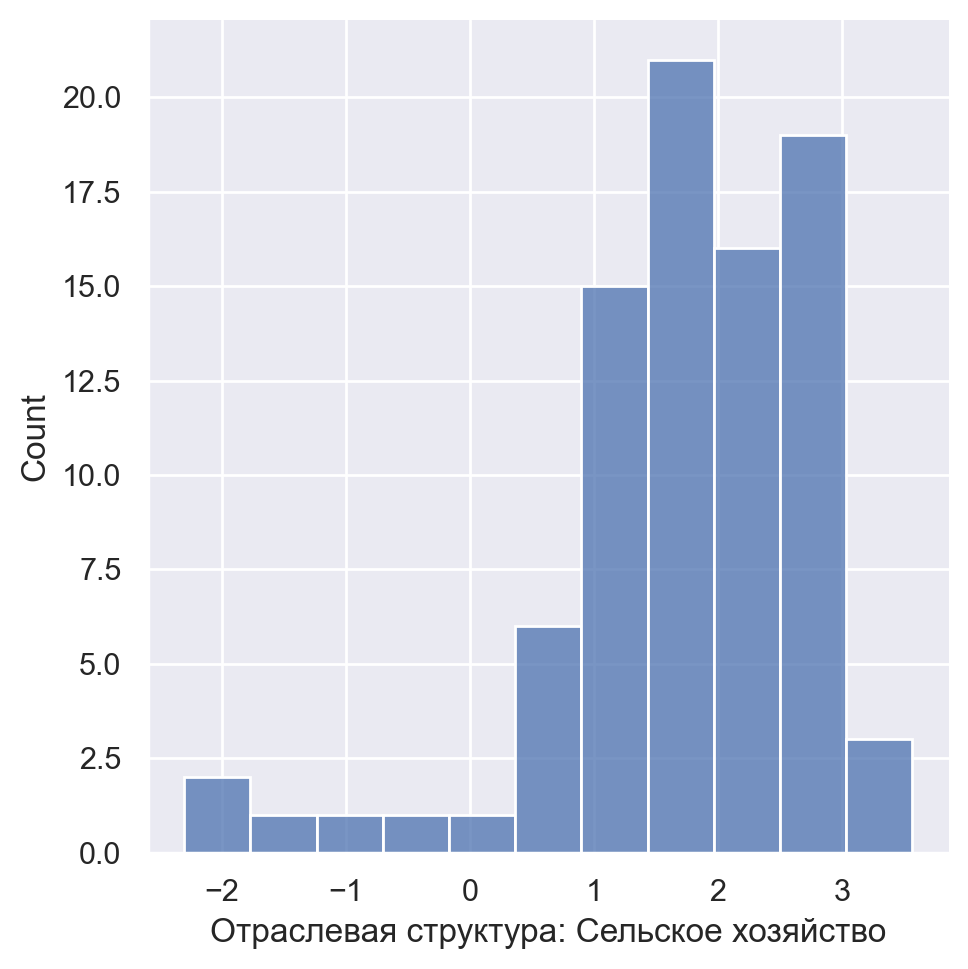

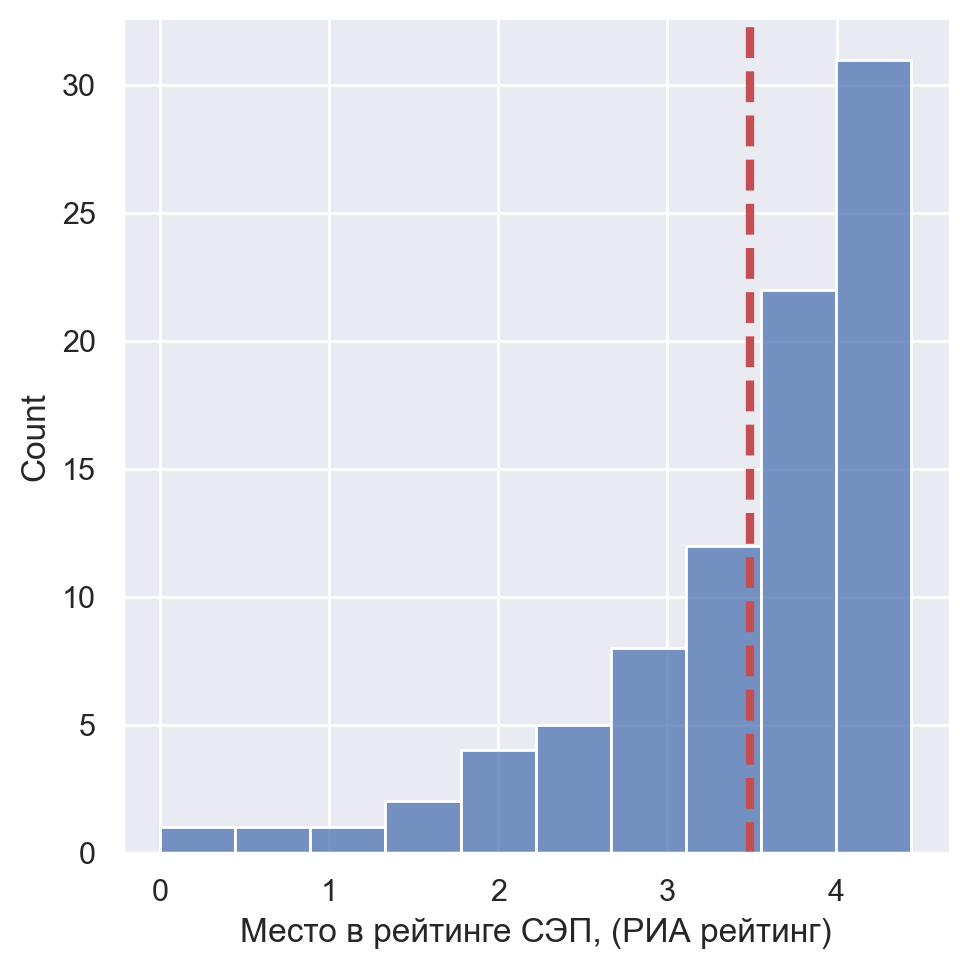

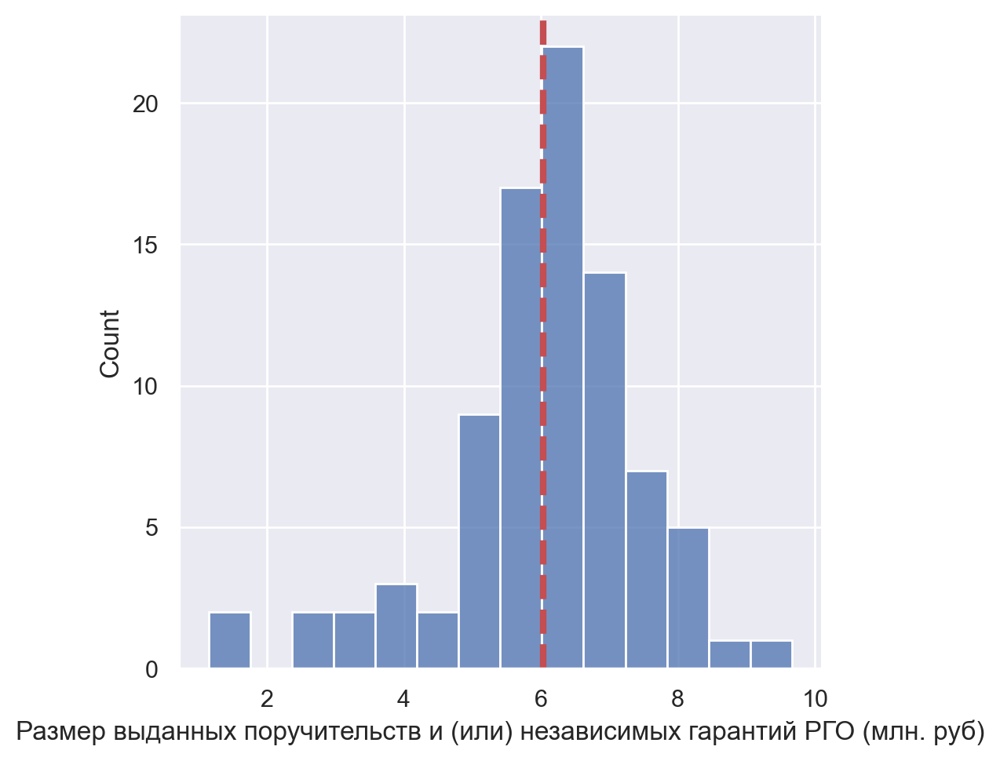

...

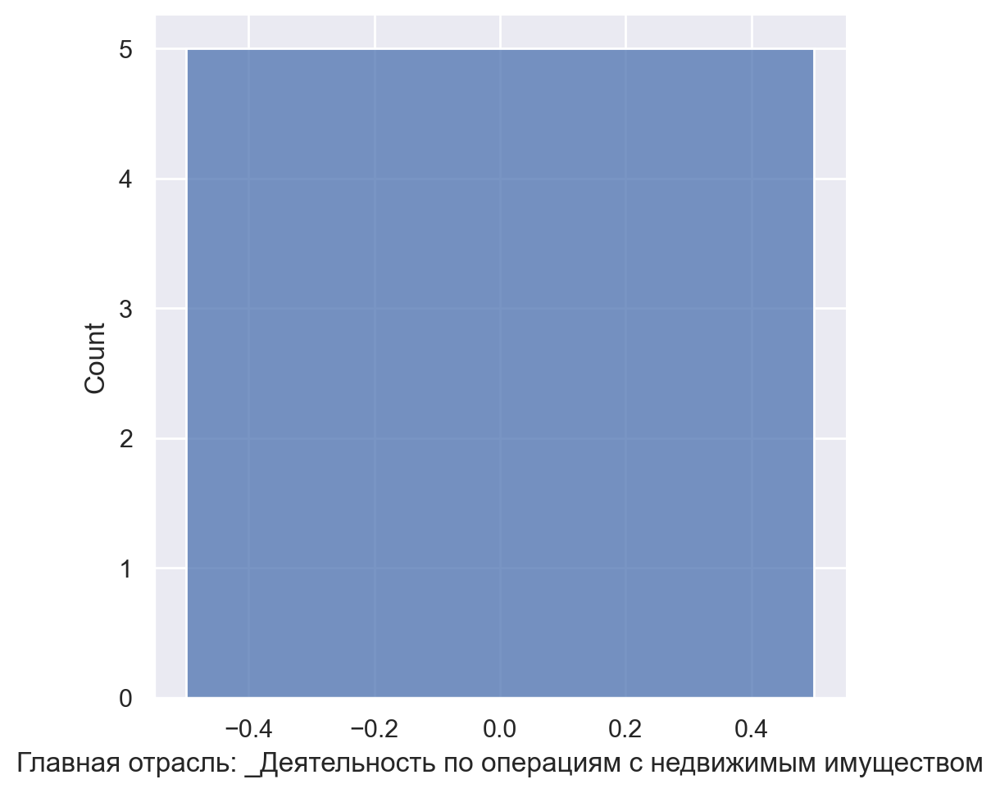

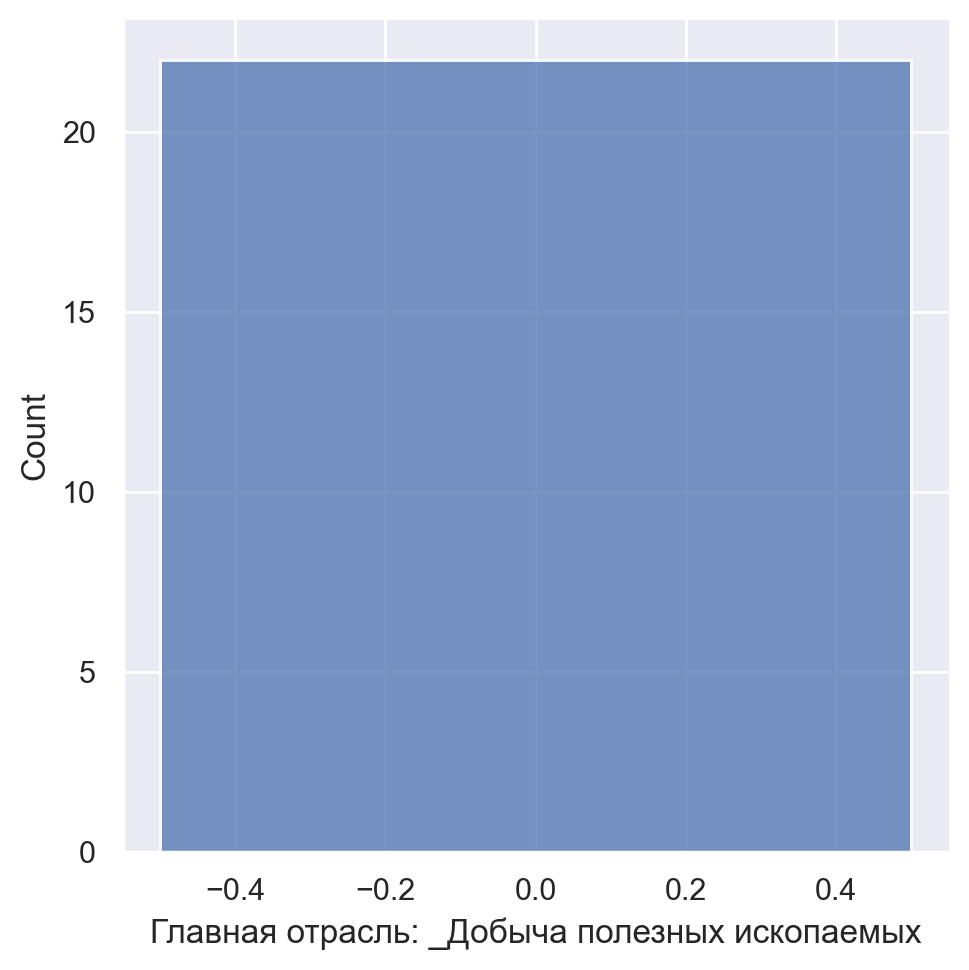

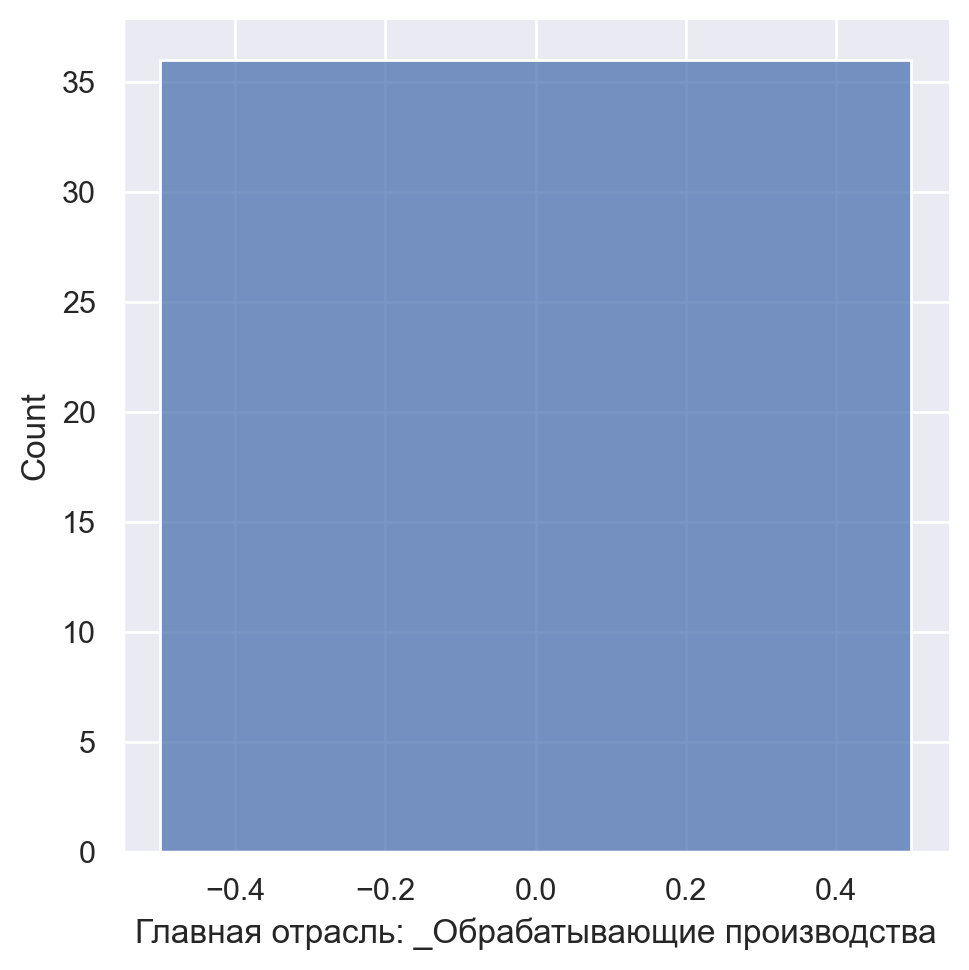

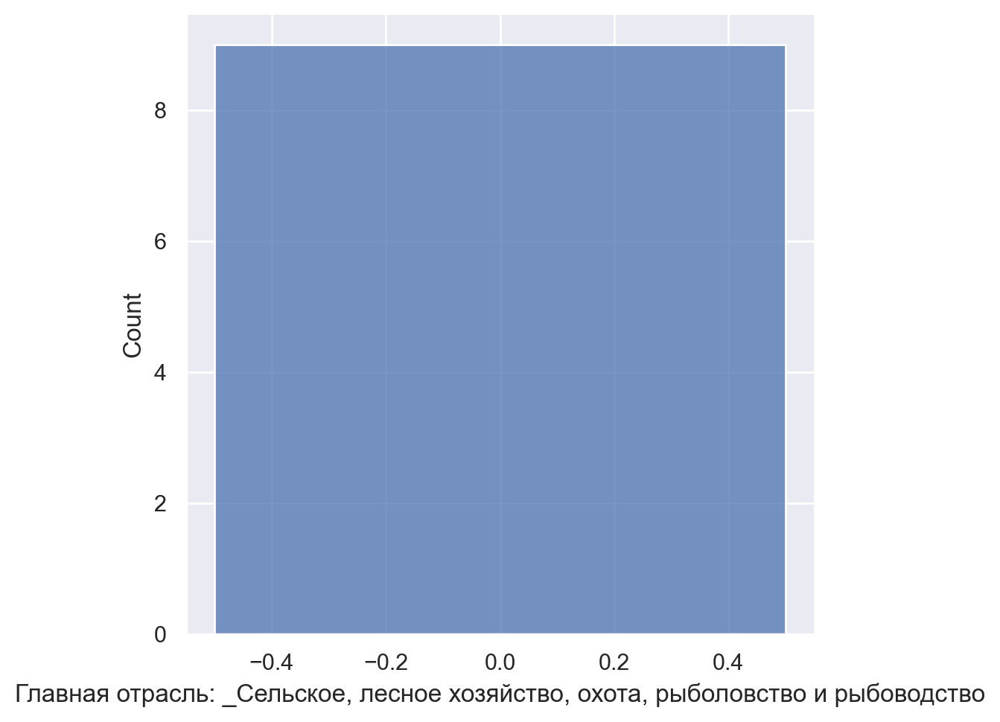

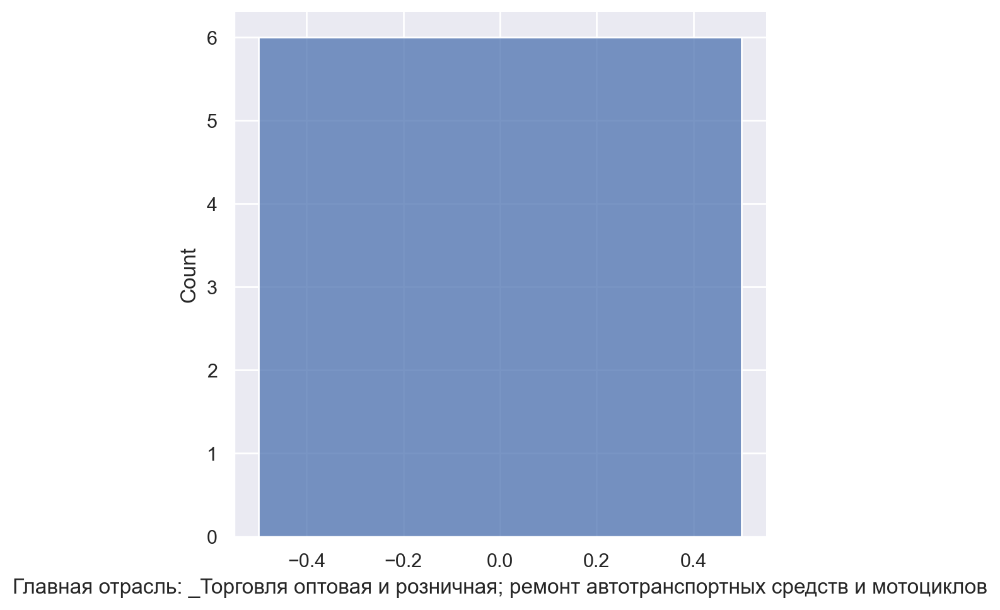

In [84]:
columns = ['Средний возраст', 'Госзакупки за 2021 год - объем', 'Объем субсидий_МЭР, выделенный из федерального бюджета  бюджетам субъектов РФ, т.р.']
for i in X.columns[1:]:
    sns.displot(np.log(X[i]))
    plt.axvline(np.mean(np.log(X[i])), color='r', linestyle='dashed', linewidth=3)
    plt.show()

In [85]:
columns_to_log = X.columns[1:].tolist()
new_list = []
for i in [1, 2, 5, 7, 12, 18]:
    new_list.append(columns_to_log[i])

In [86]:
to_log = X.copy()
for elem in new_list:
    to_log[elem] = np.log(to_log[elem]+1)
to_log

,const,"Объем поддержки, оказанной Сбером - млн",Количество выданных поручительств и (или) независимых гарантий РГО (единиц),Отраслевая структура: Сельское хозяйство,"Место в рейтинге СЭП, (РИА рейтинг)",Размер выданных поручительств и (или) независимых гарантий РГО (млн. руб),"Объем поддержки, оказанной Сбером - кол-во ИП/ООО",Госзакупки за 2021 год - кол-во,Отраслевая структура: Обрабатывающие производства,"Численность тредоспособного населения, т. чел.",...,Средний возраст,Количество моногородов,"Среднемесячная начисленная заработная плата наёмных работников \nв организациях, у индивидуальных предпринимателей и физических лиц",Введено в действие общей площади жилых домов на 1000 человек населения,наличие ОЭЗ,Главная отрасль: _Деятельность по операциям с недвижимым имуществом,Главная отрасль: _Добыча полезных ископаемых,Главная отрасль: _Обрабатывающие производства,"Главная отрасль: _Сельское, лесное хозяйство, охота, рыболовство и рыбоводство",Главная отрасль: _Торговля оптовая и розничная; ремонт автотранспортных средств и мотоциклов
2,1.0,4608.577130,4.025352,1.335001,61.0,380.47015,5.389072,14513,3.165475,543.2,...,42.47,2.397895,25909,558.188612,1.0,0,0,1,0,0
3,1.0,13612.635807,6.315358,1.902108,24.0,4085.04551,6.255750,50486,2.674149,1565.5,...,39.86,1.098612,39467,720.291017,0.0,0,0,0,0,1
4,1.0,10307.211844,4.919981,2.928524,40.0,799.59418,6.493754,34220,3.173878,1239.8,...,40.88,1.791759,27523,433.200600,1.0,0,0,1,0,0
5,1.0,4062.861036,4.317488,2.028148,37.0,651.23984,5.560682,14505,2.862201,582.0,...,40.52,0.693147,34764,1242.148031,1.0,1,0,0,0,0
6,1.0,8895.533295,4.204693,3.054001,50.0,725.45631,5.662960,9376,2.980619,701.2,...,43.11,1.609438,28971,667.084867,0.0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84,1.0,205.591232,4.007333,1.098612,78.0,287.04734,3.135494,1447,0.182322,31.0,...,35.80,1.807508,114530,60.722320,0.0,0,1,0,0,0
85,1.0,5974.761191,6.267201,0.470004,14.0,2987.69016,5.924256,35127,1.960095,2239.5,...,36.42,1.807508,70476,732.262842,0.0,0,1,0,0,0
86,1.0,1879.988143,5.298317,0.182322,5.0,1816.06046,5.638355,40598,0.916291,1021.9,...,35.86,1.807508,71797,529.914505,0.0,0,1,0,0,0
87,1.0,1427.923048,4.770685,0.095310,6.0,313.95295,5.416100,20807,1.824549,347.7,...,34.51,1.807508,104272,314.048955,0.0,0,1,0,0,0


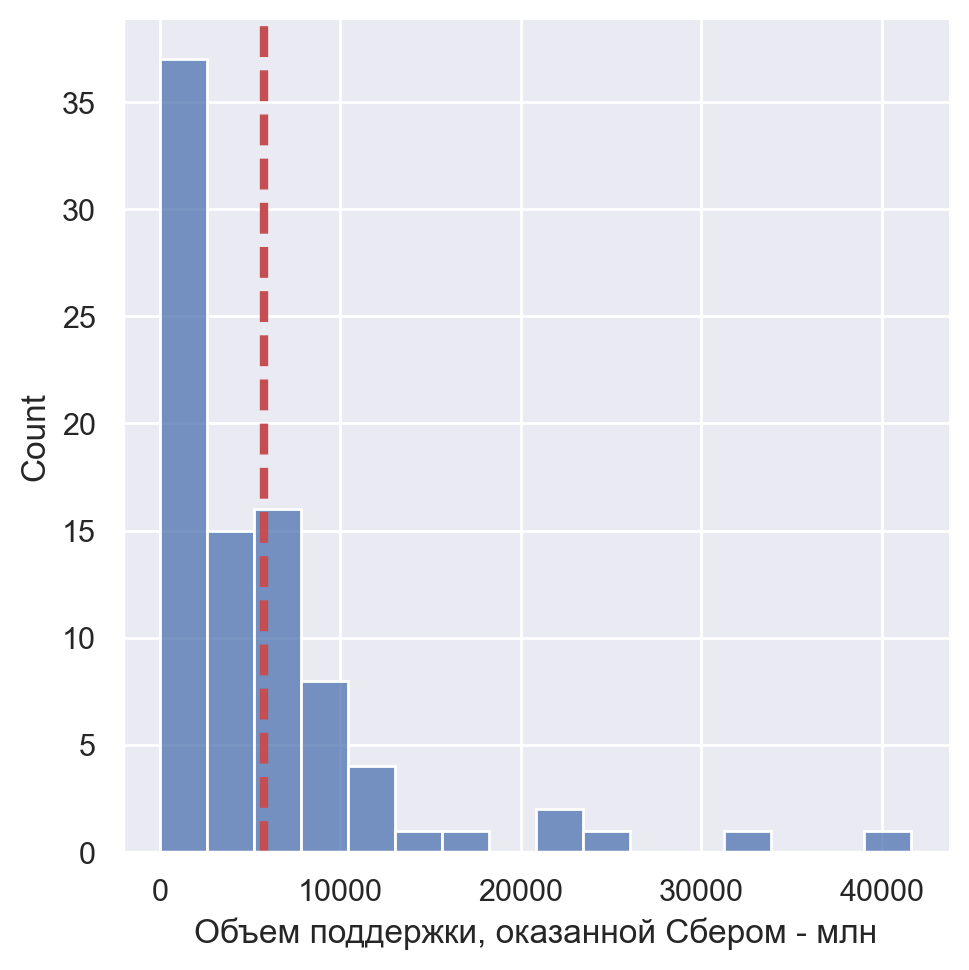

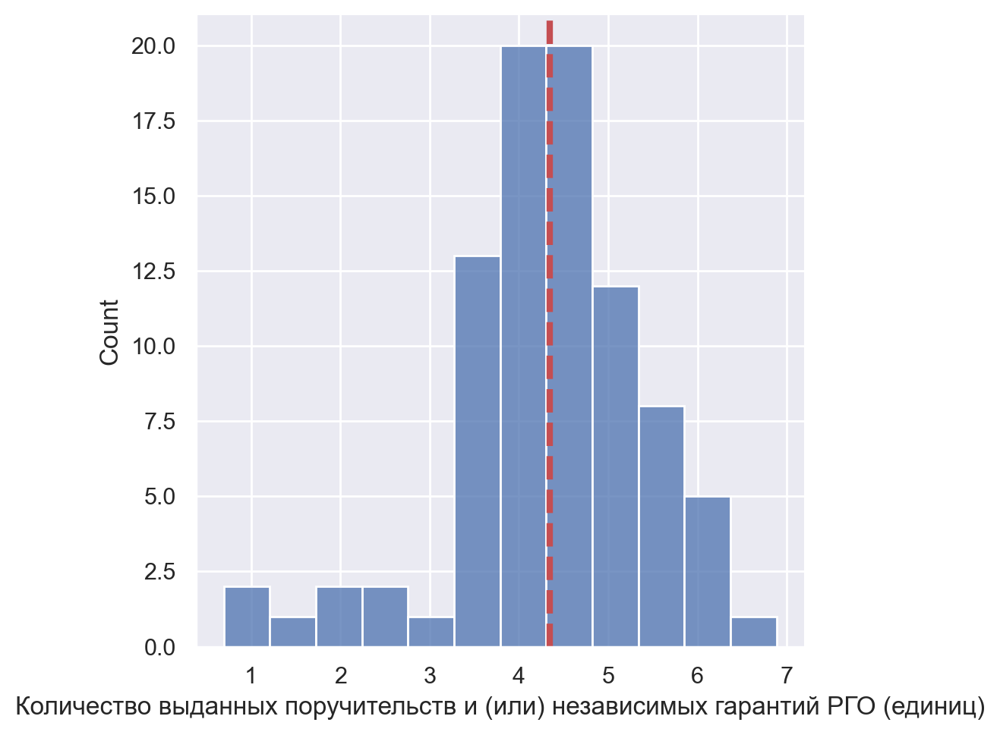

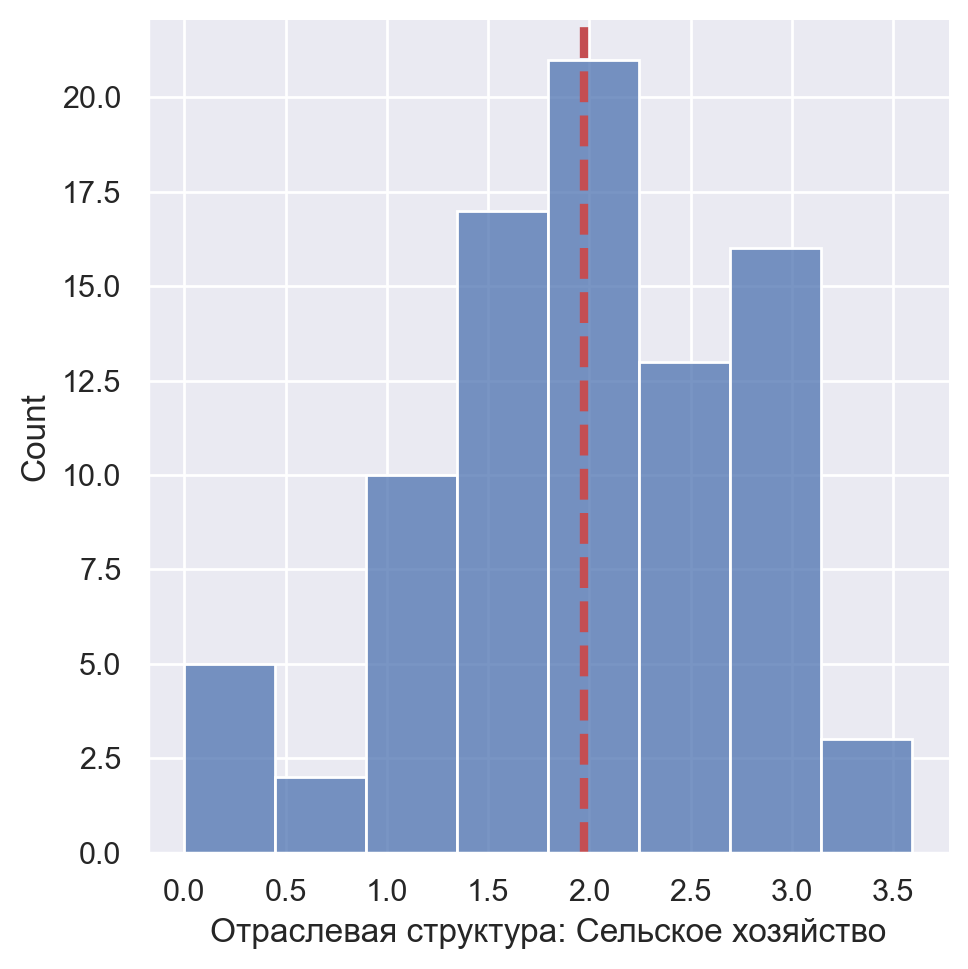

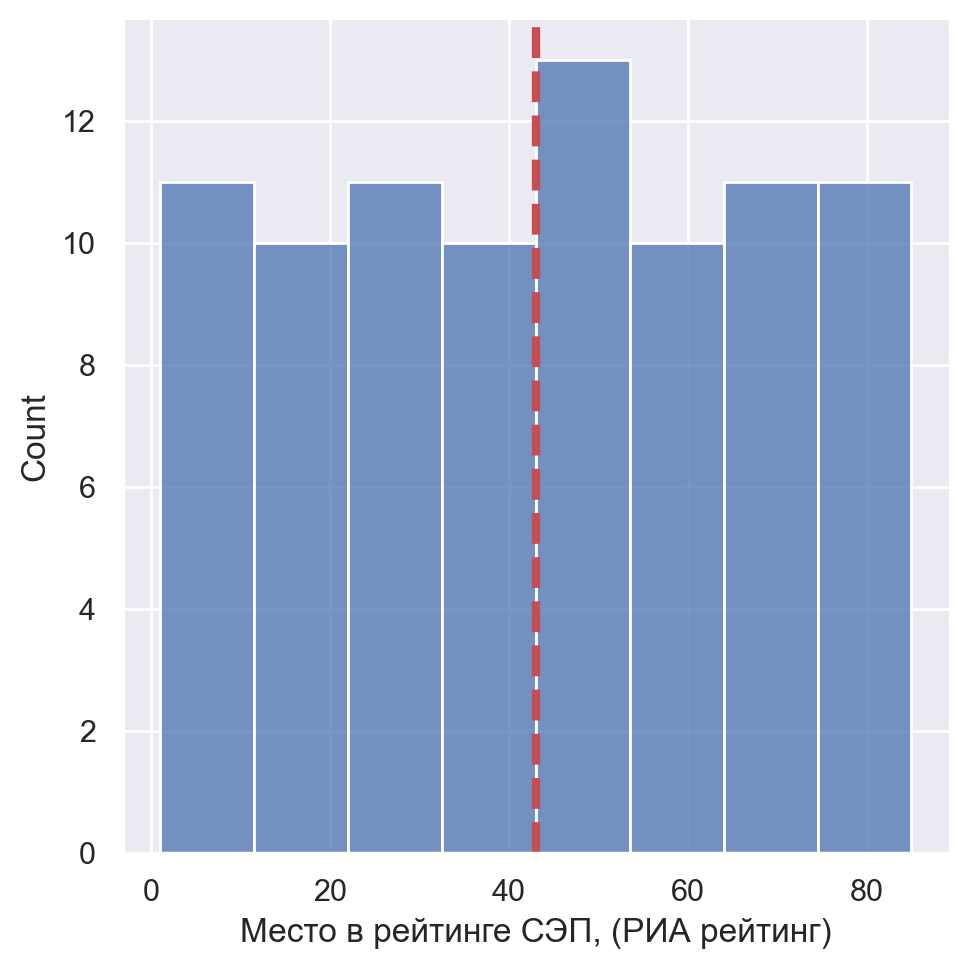

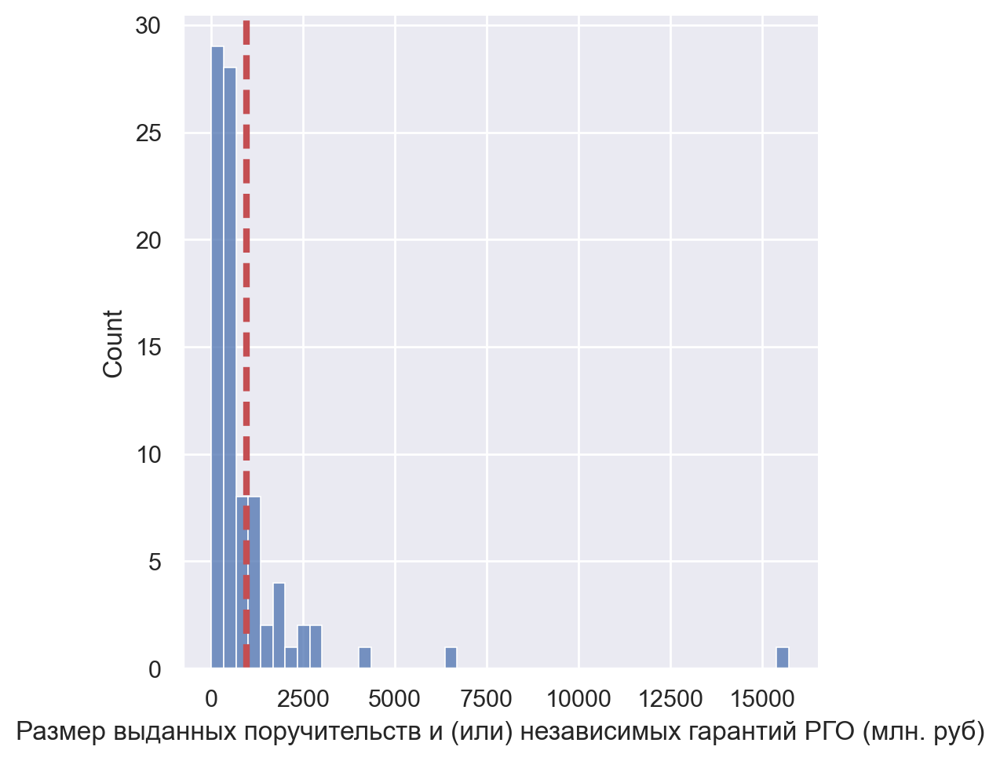

...

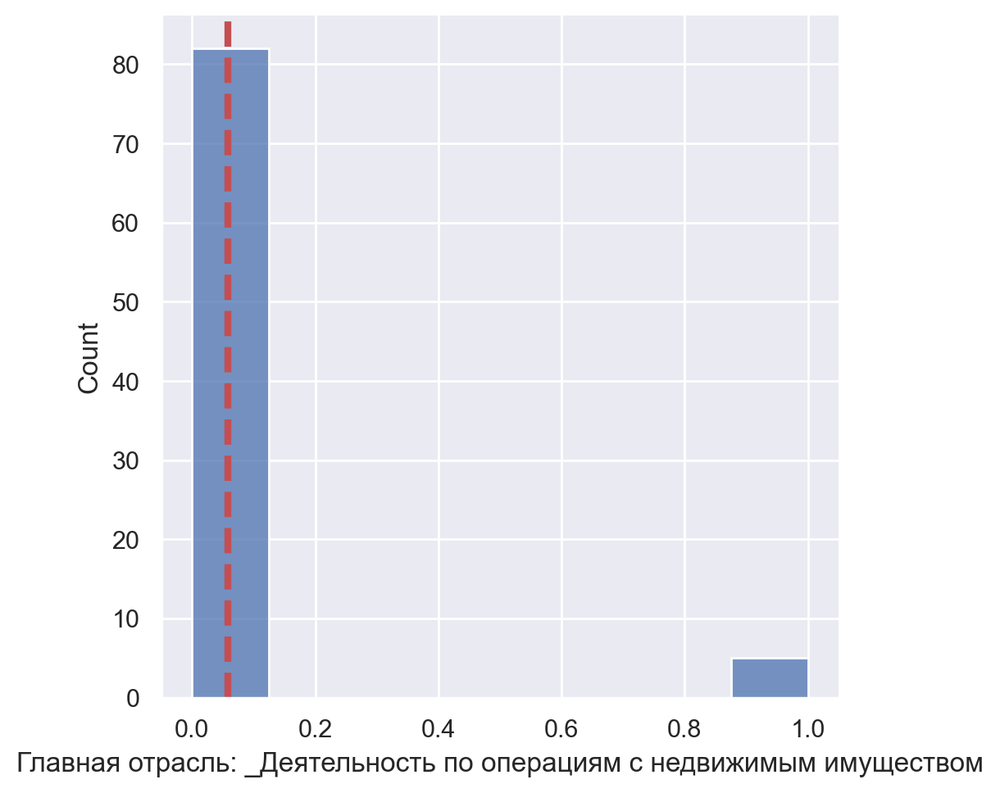

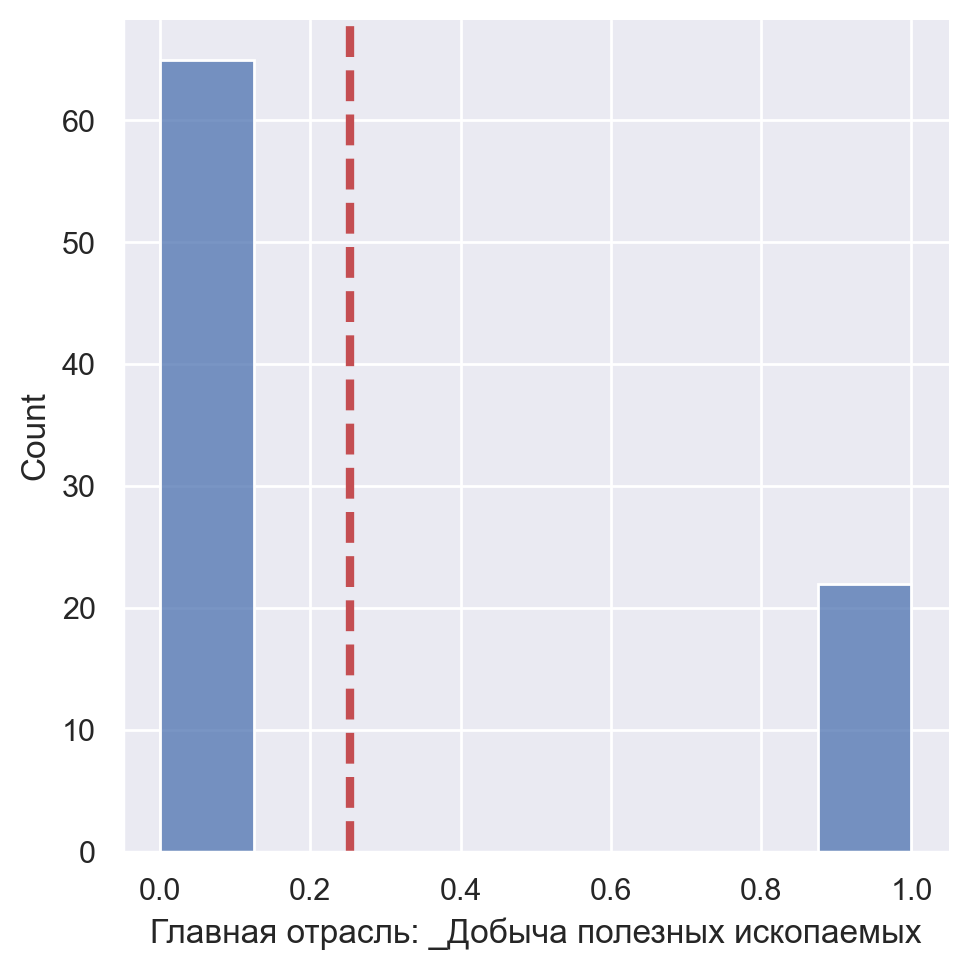

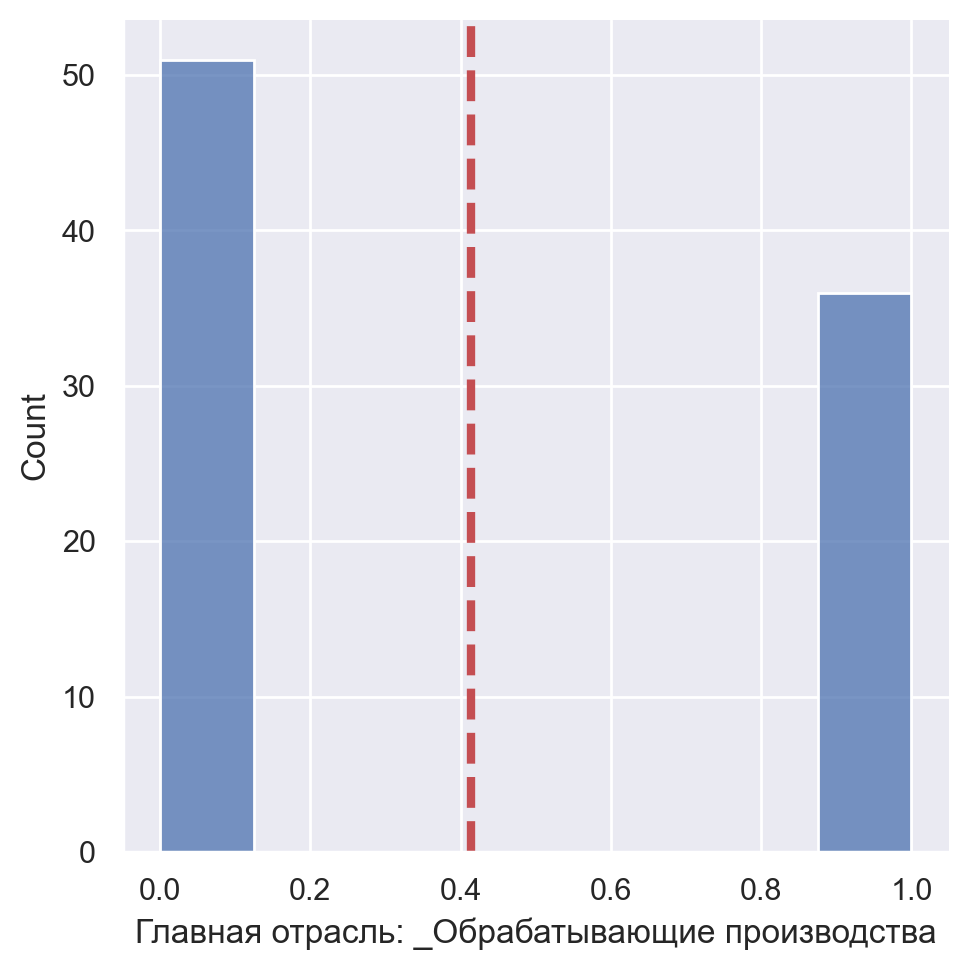

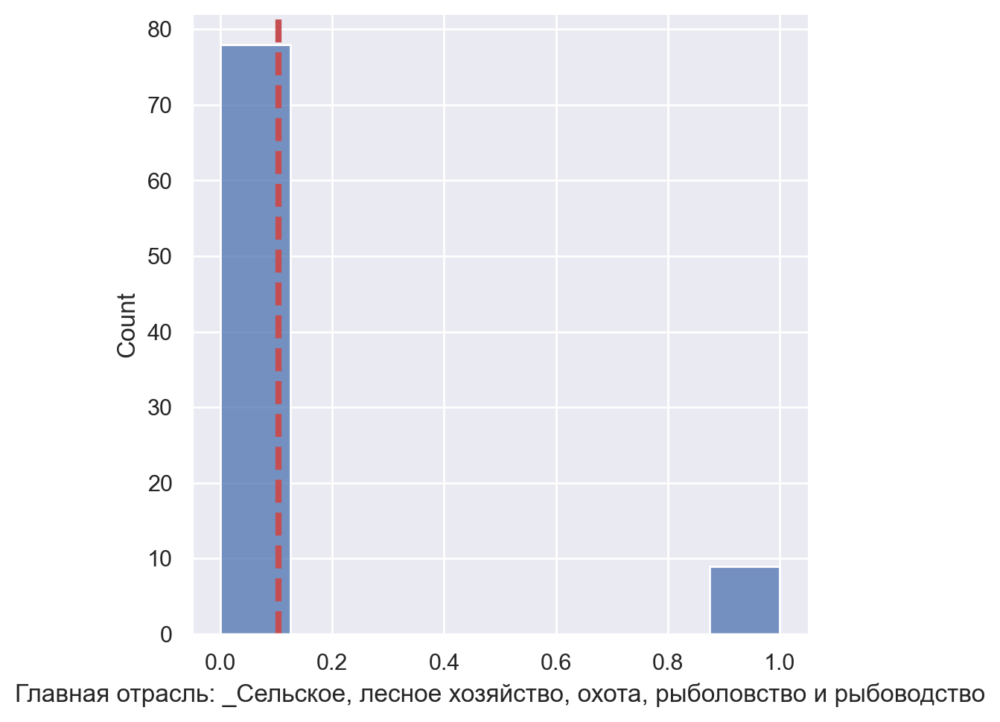

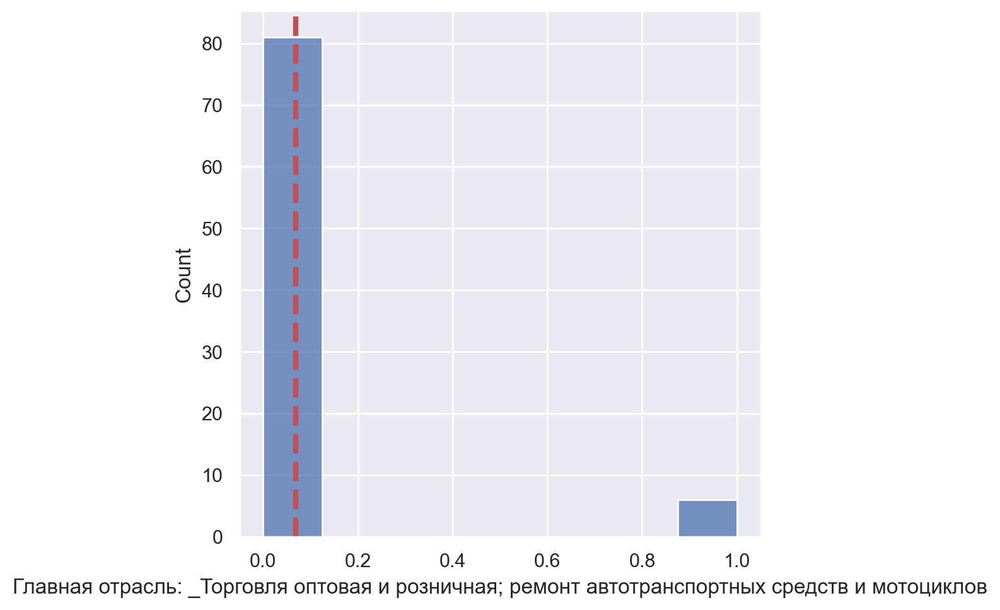

In [87]:
for i in to_log.columns[1:]:
    sns.displot(to_log[i])
    plt.axvline(np.mean(to_log[i]), color='r', linestyle='dashed', linewidth=3)
    plt.show()

In [88]:
ks_log = sm.OLS(Y, to_log)
ks_res_log = ks_log.fit()
ks_res_log.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         Доля МСП в ВРП   R-squared:                       0.803
Model:                            OLS   Adj. R-squared:                  0.713
Method:                 Least Squares   F-statistic:                     8.926
Date:                Mon, 04 Dec 2023   Prob (F-statistic):           1.79e-12
Time:                        13:59:23   Log-Likelihood:                -234.73
No. Observations:                  87   AIC:                             525.5
Df Residuals:                      59   BIC:                             594.5
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
======================================================================================================================================================================================================
                                                                                                                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                                                 16.2293     21.518      0.754      0.454     -26.828      59.286
Объем поддержки, оказанной Сбером - млн                                                                                                0.0004      0.000      1.836      0.071   -3.32e-05       0.001
Количество выданных поручительств и (или) независимых гарантий РГО (единиц)                                                            1.0115      0.888      1.139      0.259      -0.766       2.789
Отраслевая структура: Сельское хозяйство                                                                                               0.1509      1.460      0.103      0.918      -2.771       3.073
Место в рейтинге СЭП, (РИА рейтинг)                                                                                                    0.0721      0.061      1.179      0.243      -0.050       0.194
Размер выданных поручительств и (или) независимых гарантий РГО (млн. руб)                                                             -0.0001      0.001     -0.121      0.904      -0.002       0.002
Объем поддержки, оказанной Сбером - кол-во ИП/ООО                                                                                     -0.0332      0.820     -0.040      0.968      -1.675       1.608
Госзакупки за 2021 год - кол-во                                                                                                     2.249e-05    8.3e-05      0.271      0.787      -0.000       0.000
Отраслевая структура: Обрабатывающие производства                                                                                     -2.0231      1.490     -1.358      0.180      -5.004       0.958
Численность тредоспособного населения, т. чел.                                                                                     -5.418e-05      0.003     -0.018      0.986      -0.006       0.006
Уровень безработицы                                                                                                                   -0.2564      0.261     -0.982      0.330      -0.779       0.266
Объем субсидий_МЭР, выделенный из федерального бюджета  бюджетам субъектов РФ, т.р.                                                 3.761e-06   6.49e-06      0.579      0.565   -9.23e-06    1.68e-05
Кол-во центров Мой бизнес                                                                         

# Тестовые прогнозы

In [89]:
X_train, X_test, y_train, y_test = train_test_split(to_log, Y, test_size=0.3, random_state=42)

In [90]:
ks_splitted = sm.OLS(y_train, X_train)
ks_splitted_res = ks_splitted.fit()
ks_splitted_res.summary()#Уровень безработицы 	Объем субсидий_МЭР, выделенный из федерального бюджета бюджетам субъектов РФ, т.р. 	Объем поддержки, оказанной Сбером - кол-во ИП/ООО 	Количество моногородов 	Отраслевая структура: Сельское хозяйство 	Площадь объектов недвижимости, находящихся на территории индустриальных (промышленных) парков, кв. м 	Госзакупки за 2021 год - объем 	Среднемесячная начисленная заработная плата наёмных работников \nв организациях, у индивидуальных предпринимателей и физических лиц 	... 	Место в рейтинге СЭП, (РИА рейтинг) 	Средний возраст 	Объем поддержки, оказанной Сбером - млн 	Отраслевая структура: Добыча полезных ископаемых 	наличие ОЭЗ 	Главная отрасль: _Деятельность по операциям с недвижимым имуществом 	Главная отрасль: _Добыча полезных ископаемых 	Главная отрасль: _Обрабатывающие производства 	Главная отрасль: _Сельское, лесное хозяйство, охота, рыболовство и рыбоводство 	Главная отрасль: _Торговля оптовая и розничная; ремонт автотранспортных средств и мотоциклов
#0 	NaN 	77.230505 	NaN 	NaN 	24.647284 	NaN 	NaN 	NaN 	25.458881 	238.331994 	... 	NaN 	NaN 	10.447829 	13.579096 	NaN 	NaN 	11.541751 	10.411019 	NaN 	NaN
#1 rows × 27 columns

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         Доля МСП в ВРП   R-squared:                       0.864
Model:                            OLS   Adj. R-squared:                  0.750
Method:                 Least Squares   F-statistic:                     7.551
Date:                Mon, 04 Dec 2023   Prob (F-statistic):           1.10e-07
Time:                        13:59:23   Log-Likelihood:                -146.77
No. Observations:                  60   AIC:                             349.5
Df Residuals:                      32   BIC:                             408.2
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
======================================================================================================================================================================================================
                                                                                                                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                                                 10.4144     27.513      0.379      0.708     -45.627      66.456
Объем поддержки, оказанной Сбером - млн                                                                                                0.0002      0.000      0.634      0.531      -0.000       0.001
Количество выданных поручительств и (или) независимых гарантий РГО (единиц)                                                            1.3754      1.055      1.303      0.202      -0.774       3.525
Отраслевая структура: Сельское хозяйство                                                                                               3.9251      1.987      1.976      0.057      -0.122       7.972
Место в рейтинге СЭП, (РИА рейтинг)                                                                                                    0.0444      0.074      0.599      0.553      -0.107       0.196
Размер выданных поручительств и (или) независимых гарантий РГО (млн. руб)                                                              0.0012      0.001      0.878      0.386      -0.002       0.004
Объем поддержки, оказанной Сбером - кол-во ИП/ООО                                                                                     -0.9287      0.881     -1.055      0.300      -2.723       0.865
Госзакупки за 2021 год - кол-во                                                                                                     7.869e-05      0.000      0.655      0.517      -0.000       0.000
Отраслевая структура: Обрабатывающие производства                                                                                      0.7506      1.708      0.440      0.663      -2.728       4.230
Численность тредоспособного населения, т. чел.                                                                                         0.0006      0.005      0.117      0.907      -0.010       0.011
Уровень безработицы                                                                                                                   -0.1498      0.285     -0.525      0.603      -0.730       0.431
Объем субсидий_МЭР, выделенный из федерального бюджета  бюджетам субъектов РФ, т.р.                                                 4.297e-06   8.42e-06      0.510      0.614   -1.29e-05    2.15e-05
Кол-во центров Мой бизнес                                                                         

In [91]:
pred = ks_splitted_res.predict(X_test)
mean_squared_error(y_test, pred, squared=False)

6.350655804049782

In [92]:
mean_absolute_error(y_test, pred)

5.061018160047688

Отбор признаков

In [93]:
from sklearn.metrics import r2_score

best_features = {}

for i in range(20):
    max_score = -np.inf
    best_features_step = {}

    for feature in X.drop(columns = 'const').columns:
        if feature in best_features.keys():
            continue

        X_tmp = X[['const', feature]+list(best_features.keys())]
        ks = sm.OLS(Y, X_tmp)
        ks_res = ks.fit()
        y_pred = ks_res.predict(X_tmp)
        score = r2_score(Y, y_pred)
        best_features_step.update({feature: score})

    max_key = max(best_features_step, key = best_features_step.get)
    best_features.update({max_key: best_features_step.get(max_key)})

In [94]:
%config InlineBackend.figure_format = 'retina'

# sns.set(style='whitegrid', palette='deep')
# sns.set(style='darkgrid', palette='rocket')
sns.set(style='darkgrid', palette='deep')

plt.rcParams['figure.figsize'] = 8, 5
plt.rcParams['font.size'] = 12
plt.rcParams['savefig.format'] = 'pdf'

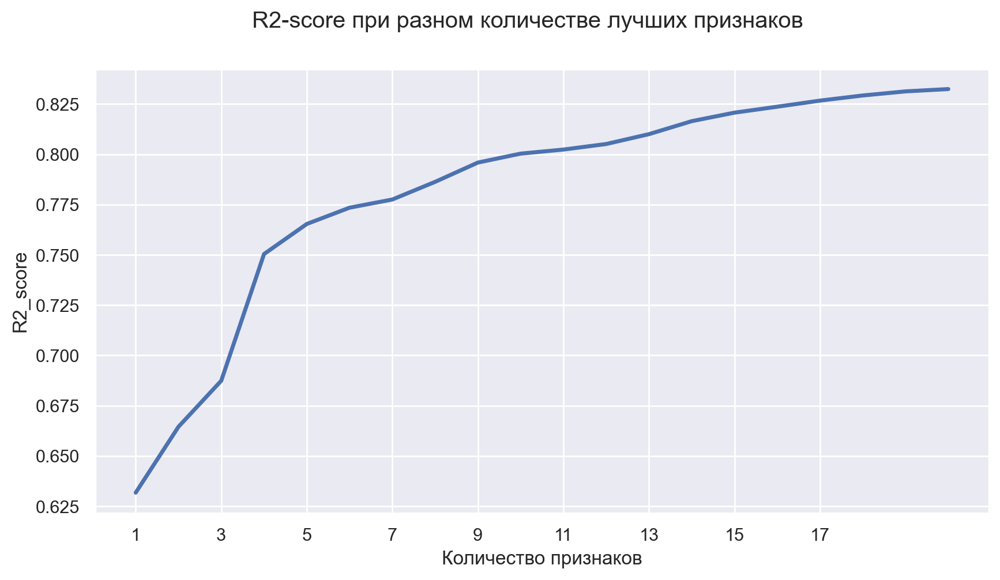

In [95]:
plt.figure(figsize = (10,5))
plt.plot(np.arange(1, len(best_features)+1), best_features.values(), linewidth = 2.5)
plt.xticks(np.arange(1, 19, 2))
plt.xlabel('Количество признаков')
plt.ylabel('R2_score')
plt.suptitle('R2-score при разном количестве лучших признаков')
plt.show()

In [96]:
list(best_features.keys())[:5]

['Отраслевая структура: Добыча полезных ископаемых',
 'Среднемесячная начисленная заработная плата наёмных работников \nв организациях, у индивидуальных предпринимателей и физических лиц',
 'Отраслевая структура: Обрабатывающие производства',
 'Уровень безработицы',
 'Объем субсидий_МЭР, выделенный из федерального бюджета  бюджетам субъектов РФ, т.р.']

In [97]:
prstd, iv_l, iv_u = wls_prediction_std(ks_splitted_res)

In [98]:
prstd

array([4.65517674, 4.33288865, 4.40646655, 4.32482222, 4.34028165,
       4.26269085, 5.36030451, 4.70840016, 5.06875579, 4.32238358,
       4.97759124, 4.58109569, 4.72098034, 4.57046683, 4.30849992,
       4.76475844, 4.45485432, 4.79876486, 4.42012935, 4.69241651,
       4.9742908 , 4.63640915, 4.23731207, 4.53789457, 4.64111605,
       4.87468616, 5.04762758, 4.51735285, 4.53037231, 4.54279852,
       4.19821699, 4.77013345, 4.21709019, 4.44252236, 4.92062054,
       4.92397718, 4.51560397, 4.55745689, 4.62884632, 4.6839866 ,
       5.07897505, 4.80252063, 4.87552776, 4.63422414, 4.69521709,
       4.6226121 , 4.20385973, 4.50176479, 4.86034726, 5.36611694,
       4.18933217, 4.34110297, 4.29965579, 4.25014814, 4.43360502,
       4.61367509, 4.47620287, 4.42707046, 5.19243772, 5.06635474])

In [99]:
iv_l

41    11.270884
33    18.774704
37    17.074355
47    18.785768
46    13.356870
18    13.614642
44    14.002275
36    20.640759
9     22.919525
51    12.490327
63    13.447444
21    21.256645
74     5.146893
27    21.387027
49    15.934785
15    20.889170
26    20.890177
5     19.569985
19    15.762844
40    15.427576
10    23.916376
71     1.912851
8     18.972186
58    12.119488
38    21.036596
80    -1.317709
88    -9.566143
56    10.416406
45    12.898370
52    16.373560
48    18.485494
87    -4.990940
17    22.383857
72     9.154729
29    18.617840
43    14.890159
64    11.820880
60    12.245298
50    14.824663
79     9.686042
59    13.916682
34    14.602444
84     0.118862
61    13.044313
65    10.327690
77     4.983970
39    17.406640
31    18.914079
3     24.353636
54    10.739388
23    18.598225
4     23.458932
25    18.962266
83     3.092631
76     6.006553
22    19.968862
62     9.308255
73     8.838017
16    19.094751
53    10.601591
dtype: float64

In [100]:
iv_u

41    30.235453
33    36.426315
37    35.025713
47    36.404517
46    31.038599
18    30.980277
44    35.839441
36    39.822154
9     43.568960
51    30.099142
63    33.725487
21    39.919418
74    24.379538
27    40.006500
49    33.487039
15    40.300161
26    39.038660
5     39.119513
19    33.769862
40    34.543856
10    44.180973
71    20.800963
8     36.234430
58    30.606266
38    39.943884
80    18.541112
88    10.997219
56    28.819499
45    31.354502
52    34.880315
48    35.588471
87    14.441948
17    39.563720
72    27.252973
29    38.663793
43    34.949786
64    30.216849
60    30.811770
50    33.681966
79    28.767979
59    34.607749
34    34.167272
84    19.981112
61    31.923524
65    29.455379
77    23.815875
39    34.532604
31    37.253668
3     44.154043
54    32.600233
23    35.665006
4     41.144007
25    36.478491
83    20.407168
76    24.068469
22    38.764359
62    27.543708
73    26.873312
16    40.248050
53    31.241245
dtype: float64

In [109]:
pred = ks_splitted_res.get_prediction(sm.add_constant(X_test)).summary_frame()
pred['y'] = y_test
pred

,mean,mean_se,mean_ci_lower,mean_ci_upper,obs_ci_lower,obs_ci_upper,y
78,19.667702,5.228295,9.018014,30.317390,6.472180,32.863224,12.487504
2,23.521170,2.577051,18.271890,28.770451,14.126444,32.915897,40.168474
28,21.289722,3.810211,13.528577,29.050867,10.292390,32.287055,28.075798
24,24.661065,2.151032,20.279556,29.042574,15.722185,33.599944,28.710987
14,25.024047,5.532951,13.753795,36.294299,11.322787,38.725307,32.093048
69,26.741034,2.191149,22.277810,31.204258,17.761818,35.720250,17.846206
12,25.771478,3.621306,18.395120,33.147836,15.042237,36.500719,32.596827
20,30.235685,4.516047,21.036799,39.434571,18.180585,42.290786,29.747166
6,27.045730,3.316927,20.289370,33.802089,16.732905,37.358554,33.963277
70,19.521867,2.244586,14.949795,24.093939,10.488053,28.555680,17.492357
